# WRMD alert 
#### Developing an alert for cases greater than expected

In [1]:
import os as os
os.chdir('C:/Users/falco/Desktop/directory/WMMEAS/')
%matplotlib inline
from WRMDpy import WRMDalert as alert
from WRMDpy import read_data as read_data
#Always run this the command before at the start of notebook
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
#import cufflinks as cf
#cf.set_config_file(offline=True, world_readable=True, theme='ggplot')
data_path = 'C:/Users/falco/Desktop/directory/WRMD_paper/data/'
import plotly
init_notebook_mode()
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.style as style
style.use('fivethirtyeight')
plt.rcParams['font.family'] = 'Times New Roman'
sns.set_context("notebook", font_scale=1.30, rc={"lines.linewidth": 0.8})

C:\Users\falco\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\falco\anaconda3\lib\site-packages\numpy\.libs\libopenblas.NOIJJG62EMASZI6NYURL6JBKM4EVBGM7.gfortran-win_amd64.dll
C:\Users\falco\anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


#### Example 1: Mourning Dove

As an example we will work on one data for **Mourning Dove or American Mourning Dove**

1. We will just plot the timeline for this species

2. See Rolling mean and std deviation. 

3. Test for stationarity of the timeline (TS)

A TS is said to be stationary if its statistical properties such as mean, variance remain constant over time.

It is important because most of the TS models work on the assumption that the TS is stationary. Intuitively, we can sat that if a TS has a particular behaviour over time, there is a very high probability that it will follow the same in the future. Also, the theories related to stationary series are more mature and easier to implement as compared to non-stationary series.

Stationarity is defined using very strict criterion. However, for practical purposes we can assume the series to be stationary if it has constant statistical properties over time, ie. the following:

1. constant mean
2. constant variance
3. an autocovariance that does not depend on time.

**Plotting Rolling Statistics**: We can plot the moving average or moving variance and see if it varies with time. By moving average/variance I mean that at any instant ‘t’, we’ll take the average/variance of the last year, i.e. last 12 months. But again this is more of a visual technique.

**Dickey-Fuller Test**: This is one of the statistical tests for checking stationarity. Here the null hypothesis is that the TS is non-stationary. The test results comprise of a Test Statistic and some Critical Values for difference confidence levels. If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis and say that the series is stationary. Refer this article for details.

**Decomposing** In this approach, both trend and seasonality are modeled separately and the remaining part of the series is returned. I’ll skip the statistics and come to the results:


In [2]:
data  = read_data.read_data(filename=data_path+'Predicted_final_str_adjusted.csv')

In [3]:
data.shape

(219767, 55)

### Simple statistical approaches of detecting an **alert**

in a non-stationary timeseries (i.e.) the mean and std are not constant, 

we can define an anomaly as **an observation outlying the mean+2*std**  

First we will try this approach on number of **weekly** admissions 

In [4]:
data.head()

,Unnamed: 0,Admitted_at,WRMD_ID,Case,Admitted_at.1,Species,Organization,Reasons,Address_found,Latitude,...,prediction_adjusted,Unnamed: 0.1,Training_data_name,common_name,genus,species,family,order,ScientificName,prediction_str_rm
Admitted_at,,,,,,,,,,,,,,,,,,,,,
2018-05-22,0,2018-05-22,901132,18-446,2018-05-22,Virginia Opossum,Sonoma County Wildlife Rescue,Orphaned Juv.,El Torro Way Santa Rosa CA,NaN,...,stranded,62.0,Virginia Opossum,Virginia Opossum,Didelphis,virginiana,Didelphidae,Didelphimorphia,Didelphis virginiana,physical injury
2018-05-22,1,2018-05-22,901131,18-2290,2018-05-22,Virginia Opossum,Lindsay Wildlife,found alone,3607 Bickerstaff Lafayette CA,NaN,...,orphaned,62.0,Virginia Opossum,Virginia Opossum,Didelphis,virginiana,Didelphidae,Didelphimorphia,Didelphis virginiana,orphaned
2018-05-22,2,2018-05-22,901022,18-2282,2018-05-22,Virginia Opossum,Lindsay Wildlife,Found in school's garden. Looked healthy. Anot...,555 Atlantic Ave Alameda CA,NaN,...,orphaned,62.0,Virginia Opossum,Virginia Opossum,Didelphis,virginiana,Didelphidae,Didelphimorphia,Didelphis virginiana,orphaned
2018-05-22,3,2018-05-22,901027,18-845,2018-05-22,Virginia Opossum,Pacific Wildlife Care,appears injured,2385 Callender Rd. Arroyo Grande CA,NaN,...,nonspecific,62.0,Virginia Opossum,Virginia Opossum,Didelphis,virginiana,Didelphidae,Didelphimorphia,Didelphis virginiana,nonspecific
2018-05-22,4,2018-05-22,900989,18-318,2018-05-22,Virginia Opossum,Bird Ally X,"In building, orphaned",North Coast Co-Op Eureka CA,NaN,...,orphaned,62.0,Virginia Opossum,Virginia Opossum,Didelphis,virginiana,Didelphidae,Didelphimorphia,Didelphis virginiana,orphaned


In [5]:
data[data.family == 'Canidae'].Species.unique()

array([], dtype=object)

In [6]:
data.Species.value_counts()[data.Species.value_counts()>100]

Virginia Opossum                                                17496
Mallard                                                         14193
House Finch                                                     13375
Mourning Dove or American Mourning Dove                         10883
American Crow                                                    9793
                                                                ...  
Osprey                                                            113
Arctic Herring Gull or American Herring Gull or Herring Gull      112
Hawaiian Hoary Bat or Hoary Bat                                   111
Bufflehead                                                        105
Clark's Grebe                                                     102
Name: Species, Length: 143, dtype: int64

In [7]:
data.Species.unique().tolist()

['Virginia Opossum',
 'Mallard',
 'House Finch',
 'Mourning Dove or American Mourning Dove',
 'American Crow',
 "Anna's Hummingbird",
 'Rock Dove or Common Pigeon or Rock Pigeon or Fan-Tail Pigeon or Fantail Pigeon',
 'House Sparrow or English Sparrow',
 "Bryant's Fox Squirrel or Delmarva Fox Squirrel or Eastern Fox Squirrel or Fox Squirrel",
 'Western Scrub-Jay or Western Scrub Jay or Scrub Jay or California Scrub Jay or California Scrub-Jay',
 'Western Gull',
 'Northern Mockingbird',
 'California Towhee',
 "Desert Cottontail or Audubon's Cottontail",
 'Northern Raccoon or Raccoon',
 'Common Starling or Starling or European Starling',
 "Red-tailed Hawk or Harlan's Hawk",
 'Eastern Gray Squirrel or Gray Squirrel or Grey Squirrel or Eastern Grey Squirrel',
 'American Robin',
 'Lesser Goldfinch',
 'Eurasian Collared-dove or Collared Dove',
 'Common Murre or Guillemot',
 'Common Barn-owl or Barn owl',
 'Black-crowned Night-heron or Black-crowned Night Heron or Night Heron or Black Crowned

In [8]:
data.family.unique()


array(['Didelphidae', 'Anatidae', 'Fringillidae', 'Columbidae',
       'Corvidae', 'Trochilidae', 'Passerellidae', 'Sciuridae', 'Laridae',
       'Mimidae', nan, 'Procyonidae', 'Accipitridae', 'Turdidae',
       'Alcidae', 'Tytonidae', 'Ardeidae', 'Odontophoridae', 'Strigidae',
       'Mephitidae', 'Hirundinidae', 'Tyrannidae', 'Phalacrocoracidae',
       'Podicipedidae', 'Icteridae', 'Leporidae', 'Phasianidae',
       'Picidae', 'Cervidae', 'Troglodytidae', 'Molossidae',
       'Bombycillidae', 'Paridae', 'Pelecanidae', 'Cathartidae',
       'Rallidae', 'Parulidae', 'Cardinalidae', 'Gaviidae', 'Cricetidae',
       'Emydidae', 'Geomyidae', 'Vespertilionidae', 'Phrynosomatidae',
       'Apodidae', 'Falconidae', 'Testudinidae', 'Felidae', 'Pandionidae',
       'Talpidae', 'Alcedinidae', 'Scolopacidae', 'Vireonidae',
       'Cuculidae', 'Caprimulgiformes'], dtype=object)

In [9]:
#centers = 'California Wildlife Center|Native Animal Rescue|Pacific Wildlife Care|Project Wildlife|SPCA for Monterey County|Santa Barbara Wildlife Care Network'
#df_s = df_s[df_s.Organization.str.contains(centers)]
#df_s.shape

In [10]:
data.prediction_str_rm.unique().tolist()

['physical injury',
 'orphaned',
 'nonspecific',
 'neurologic disease',
 'respiratory disease',
 'gastrointestinal disease',
 'nutritional disease',
 'ocular disease',
 'skin disease',
 'petrochemical exposure',
 'hemorrhagic disease',
 'stranded']

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-04-14    101.0
2013-04-21    111.0
2013-04-28    130.0
2013-05-05    199.0
2014-03-02      9.0
2014-03-30     14.0
2014-04-06     52.0
2014-04-13    106.0
2014-04-20    202.0
2014-05-04    198.0
2014-05-11    273.0
2015-01-18      8.0
2015-03-01     16.0
2015-03-08     17.0
2015-03-29     38.0
2015-04-05    128.0
2015-04-12    169.0
2015-04-19    188.0
2015-04-26    329.0
2015-12-13     19.0
2016-02-28     11.0
2016-03-13     31.0
2016-04-03     92.0
2016-04-10    143.0
2016-04-17    227.0
2016-04-24    282.0
2016-12-18     14.0
2017-03-19     20.0
2017-03-26     26.0
2017-04-02     92.0
2017-04-09    163.0
2017-04-16    294.0
2017-04-30    363.0
2018-03-18     23.0
2018-03-25     34.0
2018-04-01     79.0
2018-04-08    104.0
2018-04-15    110.0
2018-04-22    257.0
2018-04-29    409.0
Name: anomalies, dtype: float64


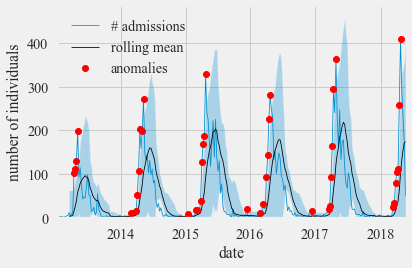

In [11]:
df_s = data[(data.Species == 'Mallard')]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome=None, sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)+2(Finch['rolling std']).plot(ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)-2(Finch['rolling std']).plot(ax= ax,label='anomalies')

ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
#plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Mallard_all.svg", dpi = 600)
plt.show()

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-16     32.0
2013-06-23     41.0
2013-12-01     97.0
2014-05-25     48.0
2015-05-10     26.0
2015-05-17     42.0
2015-05-24     54.0
2015-05-31     63.0
2015-06-07     76.0
2015-06-14     79.0
2016-05-22     49.0
2016-05-29     54.0
2016-06-05     64.0
2016-06-12     82.0
2016-06-26    109.0
2017-01-29     37.0
2017-04-30     33.0
2017-05-07     41.0
2017-05-21     64.0
2017-05-28     89.0
2017-06-25    205.0
2018-05-06     49.0
Name: anomalies, dtype: float64


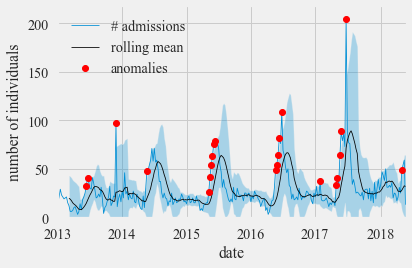

In [12]:
df_s = data[(data.family == "Accipitridae")]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome=None, sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)+2(Finch['rolling std']).plot(ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)-2(Finch['rolling std']).plot(ax= ax,label='anomalies')

ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
#plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Accipitridae.svg", dpi = 600)
plt.show()

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-07-07     5.0
2013-09-29     5.0
2014-01-19     5.0
2014-05-04     5.0
2014-08-24    13.0
2015-05-03     8.0
2015-08-30    10.0
2016-04-24     6.0
2016-09-18     6.0
2016-11-13    12.0
2017-03-05    13.0
2017-05-28    13.0
2017-08-13    16.0
2018-04-01    12.0
2018-04-08    13.0
Name: anomalies, dtype: float64


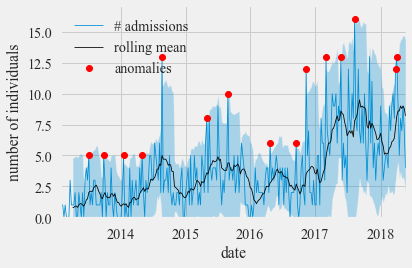

In [13]:
df_s = data[(data.Species == "Rock Dove or Common Pigeon or Rock Pigeon or Fan-Tail Pigeon or Fantail Pigeon")]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)+2(Finch['rolling std']).plot(ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)-2(Finch['rolling std']).plot(ax= ax,label='anomalies')

ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
#plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Columba_livia_neurologic.svg", dpi = 600)
plt.show()



#plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Gnatt_chart_columbidae.svg' , dpi = 600)

In [14]:
ana_week = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
ana_biweek = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False)
ana_month = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-07-07     5.0
2013-09-29     5.0
2014-01-19     5.0
2014-05-04     5.0
2014-08-24    13.0
2015-05-03     8.0
2015-08-30    10.0
2016-04-24     6.0
2016-09-18     6.0
2016-11-13    12.0
2017-03-05    13.0
2017-05-28    13.0
2017-08-13    16.0
2018-04-01    12.0
2018-04-08    13.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-06-26     9.0
2014-07-26    11.0
2014-08-10    15.0
2017-02-25    20.0
2017-05-11    24.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-08-31    24.0
2016-11-30    26.0
2017-03-31    35.0
2017-04-30    39.0
2017-08-31    49.0
Name: anomalies, dtype: float64


In [15]:
columba = pd.concat([ana_week, ana_biweek.anomalies, ana_month.anomalies], axis = 1)
columba.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']

In [16]:
ana_week = ana_week.loc['2017-01-01':]
ana_biweek= ana_biweek.loc['2017-01-01':]
ana_month = ana_month.loc['2017-01-01':]

In [17]:
columba = pd.concat([ana_week, ana_biweek.anomalies, ana_month.anomalies], axis = 1)
columba.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
columba.to_csv('Gantt_chart.csv')
ana_week.to_csv('Weekly.csv')
ana_biweek.to_csv('Biweekly.csv')
ana_month.to_csv('Monthly.csv')

In [18]:
import plotly.offline as py
import plotly.figure_factory as ff

py.init_notebook_mode(connected=True)

df = [dict(Task="V2 of<br>website",          Start='2018-01-01', Finish='2018-02-28'),
      dict(Task="Open<br>walks",             Start='2018-03-01', Finish='2018-10-31'),
      dict(Task="V1<br>discussion<br>forum", Start='2018-04-01', Finish='2018-04-30'),
      dict(Task="Spring<br>expeditions",     Start='2018-05-01', Finish='2018-06-30'),
      dict(Task="Assess<br>expeditions",     Start='2018-07-01', Finish='2018-07-31'),
      dict(Task="BRC talks<br>and walks",    Start='2018-08-01', Finish='2018-09-30')]

colors = ["#FCB711", "#F37021", "#CC004C", "#6460AA", "#0089D0", "#0DB14B"]

fig = ff.create_gantt(df[::-1], colors=colors[::-1], bar_width=0.25, showgrid_x=True)
py.iplot(fig)

## Strepopelia decato

In [19]:
df_s.prediction_str_rm.value_counts()

physical injury             3651
neurologic disease          1096
nonspecific                  973
orphaned                     940
nutritional disease          323
gastrointestinal disease     320
ocular disease               135
respiratory disease           91
skin disease                  76
petrochemical exposure        44
hemorrhagic disease           13
Name: prediction_str_rm, dtype: int64

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-23     5.0
2014-02-09     1.0
2014-02-16     2.0
2014-03-09     3.0
2014-03-23     4.0
2014-03-30     5.0
2015-03-22     4.0
2015-04-05     6.0
2015-04-12     7.0
2015-04-19     8.0
2015-08-09    12.0
2016-03-13     4.0
2016-03-20    10.0
2017-03-19     4.0
2017-04-02     7.0
2017-04-23     8.0
2017-07-30    11.0
2018-02-18     4.0
2018-03-04     5.0
2018-03-18     6.0
2018-03-25     7.0
Name: anomalies, dtype: float64


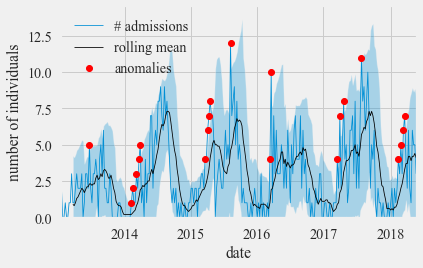

In [20]:
df_s = data[(data.Species == "Mourning Dove or American Mourning Dove")]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)+2(Finch['rolling std']).plot(ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)-2(Finch['rolling std']).plot(ax= ax,label='anomalies')

ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Mourning_Dove_neurological.svg", dpi = 600)
plt.show()

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-02     3.0
2013-06-30     6.0
2014-01-12     2.0
2014-02-16     3.0
2014-06-29     5.0
2015-03-15     3.0
2015-05-17     5.0
2015-06-14     6.0
2015-10-11     3.0
2015-12-06     4.0
2016-03-20     4.0
2017-02-12     4.0
2017-02-26     5.0
2017-05-21     9.0
2017-07-16    11.0
2018-01-14     3.0
2018-01-21     4.0
2018-05-13    14.0
Name: anomalies, dtype: float64


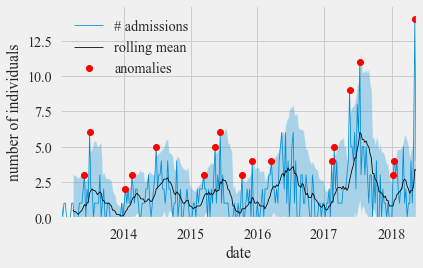

In [21]:
df_s = data[(data.Species == "Striped Skunk")]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)+2(Finch['rolling std']).plot(ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)-2(Finch['rolling std']).plot(ax= ax,label='anomalies')

ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Striped Skunk_neurological.svg", dpi = 600)
plt.show()

In [22]:
ana_week = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
ana_biweek = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False)
ana_month = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False)

Mourning_dove = pd.concat([ana_week, ana_biweek.anomalies, ana_month.anomalies], axis = 1)
Mourning_dove.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
Mourning_dove.to_csv('Gantt_chart_Mourning_dove.csv')
ana_week.to_csv('Weekly_Mourning_dove.csv')
ana_biweek.to_csv('Biweekly_Mourning_dove.csv')
ana_month.to_csv('Monthly_Mourning_dove.csv')

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-02     3.0
2013-06-30     6.0
2014-01-12     2.0
2014-02-16     3.0
2014-06-29     5.0
2015-03-15     3.0
2015-05-17     5.0
2015-06-14     6.0
2015-10-11     3.0
2015-12-06     4.0
2016-03-20     4.0
2017-02-12     4.0
2017-02-26     5.0
2017-05-21     9.0
2017-07-16    11.0
2018-01-14     3.0
2018-01-21     4.0
2018-05-13    14.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-25     8.0
2014-06-20     8.0
2015-05-16     7.0
2015-05-31     8.0
2016-02-25     7.0
2016-04-25    12.0
2017-05-05    11.0
2017-05-20    14.0
2017-07-04    17.0
2018-04-30    20.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2016-05-31    17.0
2017-05-31    24.0
Freq: 12M, Name: anomalies, dtype: float64


In [23]:
a= Mourning_dove[(Mourning_dove.anomaliesW>0)|(Mourning_dove.anomaliesBIW>0)|(Mourning_dove.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

,Type,START,W
0,Weekly,0,7
1,Biweekly,23,15
2,Weekly,28,7
3,Weekly,224,7
4,Weekly,259,7


In [24]:
b.shape

(30, 3)

In [25]:
a[['anomaliesW', 'anomaliesBIW', 'anomaliesM']]

,anomaliesW,anomaliesBIW,anomaliesM
Admitted_at,,,
2013-06-02,3.0,NaN,NaN
2013-06-25,NaN,8.0,NaN
2013-06-30,6.0,NaN,NaN
2014-01-12,2.0,NaN,NaN
2014-02-16,3.0,NaN,NaN
2014-06-20,NaN,8.0,NaN
2014-06-29,5.0,NaN,NaN
2015-03-15,3.0,NaN,NaN
2015-05-16,NaN,7.0,NaN


In [26]:
b

,Type,START,W
0,Weekly,0,7
1,Biweekly,23,15
2,Weekly,28,7
3,Weekly,224,7
4,Weekly,259,7
5,Biweekly,383,15
6,Weekly,392,7
7,Weekly,651,7
8,Biweekly,713,15
9,Weekly,714,7


Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-02     3.0
2013-06-30     6.0
2014-01-12     2.0
2014-02-16     3.0
2014-06-29     5.0
2015-03-15     3.0
2015-05-17     5.0
2015-06-14     6.0
2015-10-11     3.0
2015-12-06     4.0
2016-03-20     4.0
2017-02-12     4.0
2017-02-26     5.0
2017-05-21     9.0
2017-07-16    11.0
2018-01-14     3.0
2018-01-21     4.0
2018-05-13    14.0
Name: anomalies, dtype: float64


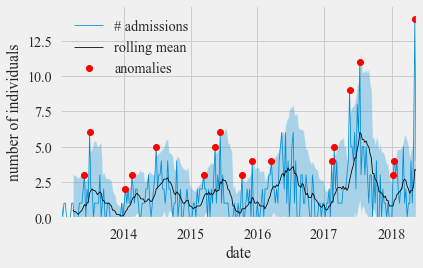

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-02     3.0
2013-06-30     6.0
2014-01-12     2.0
2014-02-16     3.0
2014-06-29     5.0
2015-03-15     3.0
2015-05-17     5.0
2015-06-14     6.0
2015-10-11     3.0
2015-12-06     4.0
2016-03-20     4.0
2017-02-12     4.0
2017-02-26     5.0
2017-05-21     9.0
2017-07-16    11.0
2018-01-14     3.0
2018-01-21     4.0
2018-05-13    14.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-25     8.0
2014-06-20     8.0
2015-05-16     7.0
2015-05-31     8.0
2016-02-25     7.0
2016-04-25    12.0
2017-05-05    11.0
2017-05-20    14.0
2017-07-04    17.0
2018-04-30    20.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2016-05-31    17.0
2017-05-31    24.0
Freq: 12M, Name: anomalies, dtype: float64


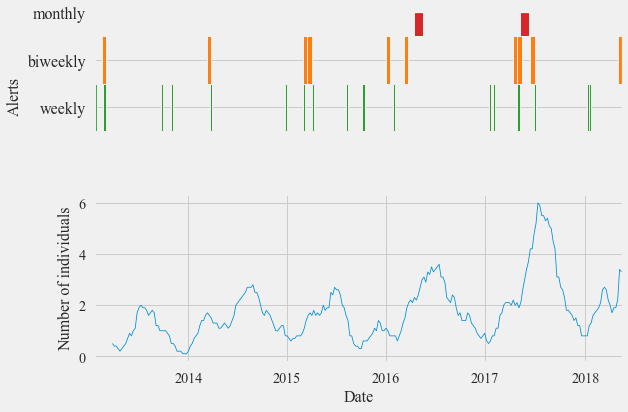

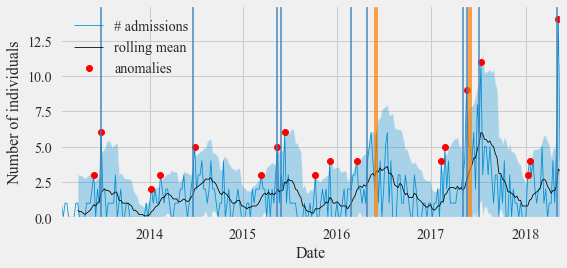

In [27]:
df_s = data[(data.Species == "Striped Skunk")]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)+2(Finch['rolling std']).plot(ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)-2(Finch['rolling std']).plot(ax= ax,label='anomalies')

ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Striped Skunk_neurological.svg", dpi = 600)
plt.show()


ana_week = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
ana_biweek = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False)
ana_month = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False)

Mourning_dove = pd.concat([ana_week, ana_biweek.anomalies, ana_month.anomalies], axis = 1)
Mourning_dove.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
Mourning_dove.to_csv('Gantt_chart_Mourning_dove.csv')
ana_week.to_csv('Weekly_Mourning_dove.csv')
ana_biweek.to_csv('Biweekly_Mourning_dove.csv')
ana_month.to_csv('Monthly_Mourning_dove.csv')

a= Mourning_dove[(Mourning_dove.anomaliesW>0)|(Mourning_dove.anomaliesBIW>0)|(Mourning_dove.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

#Weekly = pd.read_csv('Weekly.csv')
#G.columns = ['Alert', 'Start', 'Finish', 'Task']
# Declaring a figure "gnt" 
f = 16
fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(9, 6)) 
#fig = plt.figure(figsize=(6, 4))
#fig, (gnt) = plt.subplots() 
# Setting Y-axis limits 
#plt.ylim(0, 3)
gnt.set_ylim(0, 3) 
  
# Setting X-axis limits 
#plt.xlim(0, 511)
gnt.set_xlim(0, number_days) 
  
# Setting labels for x-axis and y-axis 
#gnt.set_xlabel('Date') 
gnt.set_ylabel('Alerts', fontsize = f) 
  
# Setting ticks on y-axis 
gnt.set_yticks([15, 25, 35]) 
# Labelling tickes of y-axis 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

# Setting ticks on y-axis 
#gnt.set_xticks([0, 151, 366, 510]) 
# Labelling tickes of y-axis 
#gnt.set_xticklabels(['2017', 'June 2017', '2018', 'May 2018']) 
gnt.axes.get_xaxis().set_ticks([])  
# Setting graph attribute 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
# Declaring a bar in schedule 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
ana_week['rolling mean'].plot(ax=ax)
ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(1, 1, sharex= False, figsize=(8, 4)) 
ana_week['# admissions'].plot(ax= ax,label='# admissions')
ana_week['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week.index,ana_week['rolling mean']+2*(ana_week['rolling std']), 
                ana_week['rolling mean']-2*(ana_week['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
for bw in a[a.anomaliesBIW.notna()].index.values:
    ax.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a[a.anomaliesM.notna()].index.values:
    ax.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()
#plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Gnatt_chart_Mourning.svg' , dpi = 600)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-23     9.0
2013-09-08     8.0
2014-03-09     7.0
2014-03-30     9.0
2014-07-13    14.0
2014-07-20    16.0
2014-08-10    16.0
2014-08-24    22.0
2015-01-11     9.0
2015-04-05    13.0
2015-05-03    15.0
2015-08-30    21.0
2016-03-13     9.0
2016-03-20    16.0
2017-03-05    14.0
2017-04-02    15.0
2017-04-16    16.0
2017-04-23    19.0
2018-03-04    17.0
2018-03-18    20.0
Name: anomalies, dtype: float64


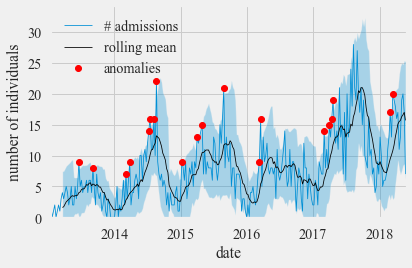

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-23     9.0
2013-09-08     8.0
2014-03-09     7.0
2014-03-30     9.0
2014-07-13    14.0
2014-07-20    16.0
2014-08-10    16.0
2014-08-24    22.0
2015-01-11     9.0
2015-04-05    13.0
2015-05-03    15.0
2015-08-30    21.0
2016-03-13     9.0
2016-03-20    16.0
2017-03-05    14.0
2017-04-02    15.0
2017-04-16    16.0
2017-04-23    19.0
2018-03-04    17.0
2018-03-18    20.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-05-27    20.0
2014-06-11    21.0
2014-06-26    27.0
2014-07-11    27.0
2014-07-26    28.0
2014-08-10    35.0
2017-03-27    30.0
2017-04-11    37.0
2017-08-09    51.0
2017-08-24    52.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-07-31     60.0
2017-04-30     65.0
2017-08-31    102.0
Name: anomalies, dtype: float64


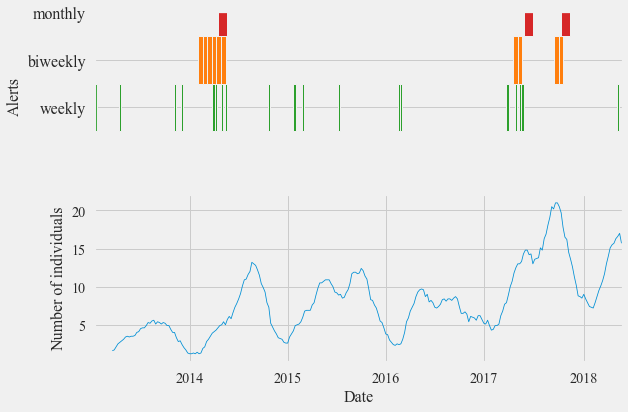

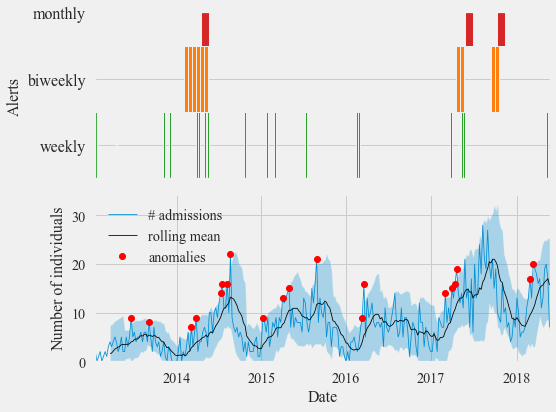

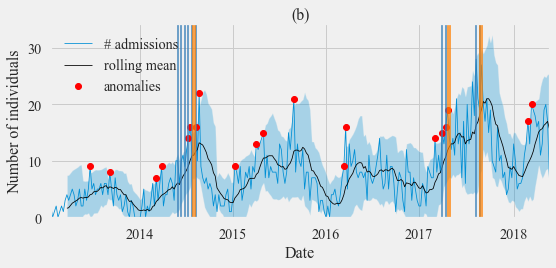

In [28]:
df_s = data[(data.family == "Columbidae")]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)+2(Finch['rolling std']).plot(ax= ax,label='anomalies')
#Finch['rolling mean'].fillna(0)-2(Finch['rolling std']).plot(ax= ax,label='anomalies')

ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/columbidae_neurological.svg", dpi = 600)
plt.show()


ana_week = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
ana_biweek = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False)
ana_month = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False)

columbidae = pd.concat([ana_week, ana_biweek.anomalies, ana_month.anomalies], axis = 1)
columbidae.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
columbidae.to_csv('Gantt_chart_columbidae.csv')
ana_week.to_csv('Weekly_columbidae.csv')
ana_biweek.to_csv('Biweekly_columbidae.csv')
ana_month.to_csv('Monthly_columbidae.csv')

a= columbidae[(columbidae.anomaliesW>0)|(columbidae.anomaliesBIW>0)|(columbidae.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

#Weekly = pd.read_csv('Weekly.csv')
#G.columns = ['Alert', 'Start', 'Finish', 'Task']
# Declaring a figure "gnt" 
f = 16
fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(9, 6)) 
#fig = plt.figure(figsize=(6, 4))
#fig, (gnt) = plt.subplots() 
# Setting Y-axis limits 
#plt.ylim(0, 3)
gnt.set_ylim(0, 3) 
  
# Setting X-axis limits 
#plt.xlim(0, 511)
gnt.set_xlim(0, number_days) 
  
# Setting labels for x-axis and y-axis 
#gnt.set_xlabel('Date') 
gnt.set_ylabel('Alerts', fontsize = f) 
  
# Setting ticks on y-axis 
gnt.set_yticks([15, 25, 35]) 
# Labelling tickes of y-axis 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

# Setting ticks on y-axis 
#gnt.set_xticks([0, 151, 366, 510]) 
# Labelling tickes of y-axis 
#gnt.set_xticklabels(['2017', 'June 2017', '2018', 'May 2018']) 
gnt.axes.get_xaxis().set_ticks([])  
# Setting graph attribute 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
# Declaring a bar in schedule 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
ana_week['rolling mean'].plot(ax=ax)
ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()
#plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Gnatt_chart_columbidae.svg' , dpi = 600)



fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(8, 6)) 
#fig = plt.figure(figsize=(6, 4))
#fig, (gnt) = plt.subplots() 
# Setting Y-axis limits 
#plt.ylim(0, 3)
gnt.set_ylim(0, 3) 
  
# Setting X-axis limits 
#plt.xlim(0, 511)
gnt.set_xlim(0, number_days) 
  
# Setting labels for x-axis and y-axis 
#gnt.set_xlabel('Date') 
gnt.set_ylabel('Alerts', fontsize = f) 
  
# Setting ticks on y-axis 
gnt.set_yticks([15, 25, 35]) 
# Labelling tickes of y-axis 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
# Declaring a bar in schedule 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
gnt.set_ylim(10)
#gnt.xaxis.set_major_locator(LinearLocator(4.87))
        
ana_week['# admissions'].plot(ax= ax,label='# admissions')
ana_week['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week.index,ana_week['rolling mean']+2*(ana_week['rolling std']), 
                ana_week['rolling mean']-2*(ana_week['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(1, 1, sharex= False, figsize=(8, 4)) 
ana_week['# admissions'].plot(ax= ax,label='# admissions')
ana_week['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week.index,ana_week['rolling mean']+2*(ana_week['rolling std']), 
                ana_week['rolling mean']-2*(ana_week['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
for bw in a[a.anomaliesBIW.notna()].index.values:
    ax.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a[a.anomaliesM.notna()].index.values:
    ax.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
ax.set_title('(b)', fontsize = f)
plt.tight_layout()

plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Gnatt_chart_columbidae.svg' , dpi = 600)

Weekly admissions


number of admissions triggering alert
Admitted_at
2014-03-30     2.0
2014-04-13     3.0
2014-04-20     8.0
2014-05-04     8.0
2014-12-28     5.0
2015-01-04    18.0
2016-01-24     6.0
2016-01-31    18.0
2016-02-07    19.0
2016-02-14    24.0
2017-01-15     6.0
2017-01-29    13.0
2017-02-12    15.0
2017-02-19    18.0
2017-03-05    22.0
2017-03-12    30.0
2018-02-18     4.0
2018-04-08     6.0
2018-04-15    13.0
Name: anomalies, dtype: float64


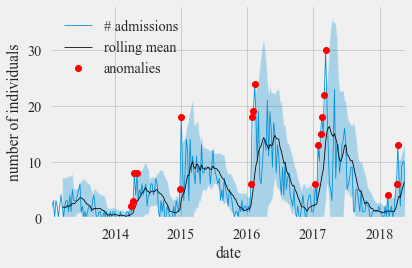

Weekly admissions


number of admissions triggering alert
Admitted_at
2014-03-30     2.0
2014-04-13     3.0
2014-04-20     8.0
2014-05-04     8.0
2014-12-28     5.0
2015-01-04    18.0
2016-01-24     6.0
2016-01-31    18.0
2016-02-07    19.0
2016-02-14    24.0
2017-01-15     6.0
2017-01-29    13.0
2017-02-12    15.0
2017-02-19    18.0
2017-03-05    22.0
2017-03-12    30.0
2018-02-18     4.0
2018-04-08     6.0
2018-04-15    13.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-03-24     4.0
2014-04-08    14.0
2014-12-19    17.0
2016-01-28    41.0
2017-02-06    36.0
2017-03-08    54.0
2018-04-02    19.0
2018-05-02    20.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2015-01-31    40.0
2016-02-29    73.0
Freq: 13M, Name: anomalies, dtype: float64


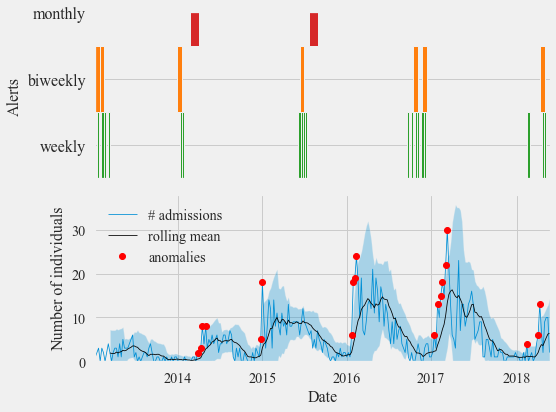

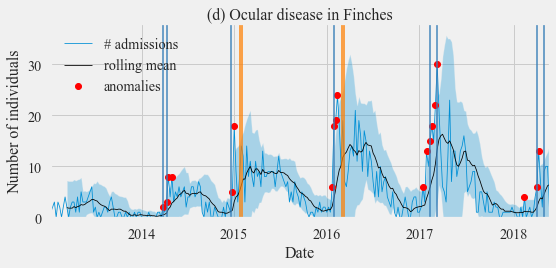

In [29]:
df_s = data[(data.family == "Fringillidae")]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='ocular disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Finches_ocular.svg", dpi = 600)
plt.show()


ana_week_finches = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='ocular disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
ana_biweek_finches = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='ocular disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False)
ana_month_finches = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='ocular disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False)

Finches = pd.concat([ana_week_finches, ana_biweek_finches.anomalies, ana_month_finches.anomalies], axis = 1)
Finches.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
Finches.to_csv('Gantt_chart_Finches.csv')
ana_week_finches.to_csv('Weekly_Finches.csv')
ana_biweek_finches.to_csv('Biweekly_Finches.csv')
ana_month_finches.to_csv('Monthly_Finches.csv')

a= Finches[(Finches.anomaliesW>0)|(Finches.anomaliesBIW>0)|(Finches.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(8, 6)) 
#fig = plt.figure(figsize=(6, 4))
#fig, (gnt) = plt.subplots() 
# Setting Y-axis limits 
#plt.ylim(0, 3)
gnt.set_ylim(0, 3) 
  
# Setting X-axis limits 
#plt.xlim(0, 511)
gnt.set_xlim(0, number_days) 
  
# Setting labels for x-axis and y-axis 
#gnt.set_xlabel('Date') 
gnt.set_ylabel('Alerts', fontsize = f) 
  
# Setting ticks on y-axis 
gnt.set_yticks([15, 25, 35]) 
# Labelling tickes of y-axis 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
# Declaring a bar in schedule 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
gnt.set_ylim(10)
#gnt.xaxis.set_major_locator(LinearLocator(4.87))
        
ana_week_finches['# admissions'].plot(ax= ax,label='# admissions')
ana_week_finches['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_finches['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_finches.index,ana_week_finches['rolling mean']+2*(ana_week_finches['rolling std']), 
                ana_week_finches['rolling mean']-2*(ana_week_finches['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()

plt.show()

a_finches = a
fig, ax = plt.subplots(1, 1, sharex= False, figsize=(8, 4)) 
ana_week_finches['# admissions'].plot(ax= ax,label='# admissions')
ana_week_finches['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_finches['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_finches.index,ana_week_finches['rolling mean']+2*(ana_week_finches['rolling std']), 
                ana_week_finches['rolling mean']-2*(ana_week_finches['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
for bw in a_finches[a_finches.anomaliesBIW.notna()].index.values:
    ax.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_finches[a_finches.anomaliesM.notna()].index.values:
    ax.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
ax.set_title('(d) Ocular disease in Finches', fontsize = f)
plt.tight_layout()

plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Gnatt_chart_Finches.svg' , dpi = 600)

In [30]:
df_s.prediction.value_counts()

physical injury             5888
orphaned                    4684
stranded                    1709
nonspecific                 1572
neurologic disease          1509
ocular disease              1331
nutritional disease          272
respiratory disease          266
skin disease                 222
gastrointestinal disease      77
petrochemical exposure        10
hemorrhagic disease            9
Name: prediction, dtype: int64

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-11     6.0
2014-07-06     8.0
2014-08-17    11.0
2014-12-28    19.0
2015-07-26     9.0
2015-08-09    10.0
2016-06-19     9.0
2017-07-16    10.0
2018-02-04    11.0
Name: anomalies, dtype: float64


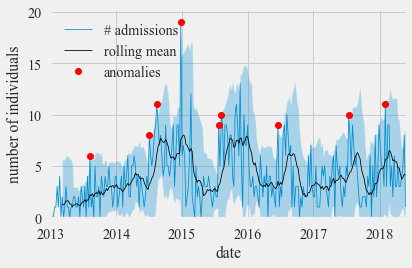

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-11     6.0
2014-07-06     8.0
2014-08-17    11.0
2014-12-28    19.0
2015-07-26     9.0
2015-08-09    10.0
2016-06-19     9.0
2017-07-16    10.0
2018-02-04    11.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-11-14    10.0
2014-07-27    18.0
2014-08-11    24.0
2016-07-16    17.0
2016-07-31    20.0
2017-07-11    18.0
2017-07-26    20.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-07-31    29.0
2014-08-31    39.0
2014-12-31    45.0
2017-07-31    30.0
Name: anomalies, dtype: float64


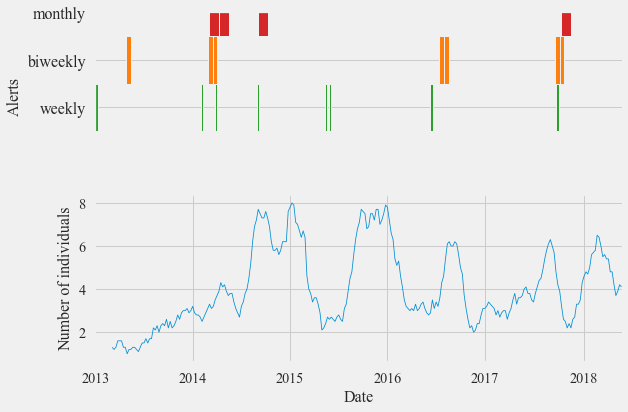

In [31]:
bird_list = ['Loon', 'Grebe']
d = data[pd.notnull(data['family'])]
families = ['Gaviidae', 'Podicipedidae', 'Laridae', 'Alcidae', 'Phalacrocoracidae', 'Pelecanidae', 'Scolopacidae']
centers = ['Santa Barbara Wildlife Care Network', 
          'Project Wildlife', 
          'California Wildlife Center',
          'Ojai Raptor Center',
          'Pasadena Humane Society and SPCA', 
          'Wildlife Care of So Cal', 
          'San Diego Humane society']
df_s = d[d['family'].str.contains('|'.join(families))]
#df_s = df_s[df_s['Organization'].str.contains('|'.join(centers))]
df_s.Organization.value_counts()
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False, adjusted = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Loon_Grebe_Neurological.svg", dpi = 600)
plt.show()


ana_week = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False, adjusted = False)
ana_biweek = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False, adjusted = False)
ana_month = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False, adjusted = False)

Loon_Grebe = pd.concat([ana_week, ana_biweek.anomalies, ana_month.anomalies], axis = 1)
Loon_Grebe.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
Loon_Grebe.to_csv('Gantt_chart_Loon_Grebe.csv')
ana_week.to_csv('Weekly_Loon_Grebe.csv')
ana_biweek.to_csv('Biweekly_Loon_Grebe.csv')
ana_month.to_csv('Monthly_Loon_Grebe.csv')

a= Loon_Grebe[(Loon_Grebe.anomaliesW>0)|(Loon_Grebe.anomaliesBIW>0)|(Loon_Grebe.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

#Weekly = pd.read_csv('Weekly.csv')
#G.columns = ['Alert', 'Start', 'Finish', 'Task']
# Declaring a figure "gnt" 
f = 16
fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(9, 6)) 
#fig = plt.figure(figsize=(6, 4))
#fig, (gnt) = plt.subplots() 
# Setting Y-axis limits 
#plt.ylim(0, 3)
gnt.set_ylim(0, 3) 
  
# Setting X-axis limits 
#plt.xlim(0, 511)
gnt.set_xlim(0, number_days) 
  
# Setting labels for x-axis and y-axis 
#gnt.set_xlabel('Date') 
gnt.set_ylabel('Alerts', fontsize = f) 
  
# Setting ticks on y-axis 
gnt.set_yticks([15, 25, 35]) 
# Labelling tickes of y-axis 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

# Setting ticks on y-axis 
#gnt.set_xticks([0, 151, 366, 510]) 
# Labelling tickes of y-axis 
#gnt.set_xticklabels(['2017', 'June 2017', '2018', 'May 2018']) 
gnt.axes.get_xaxis().set_ticks([])  
# Setting graph attribute 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
# Declaring a bar in schedule 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
ana_week['rolling mean'].plot(ax=ax)
ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-30      5.0
2013-07-14      6.0
2013-07-28     11.0
2013-08-04     19.0
2013-09-08     32.0
2014-06-29     12.0
2014-07-20     16.0
2014-07-27     23.0
2014-08-24     23.0
2014-10-19    122.0
2015-08-16     30.0
2015-08-23     44.0
2015-08-30     67.0
2015-09-06    100.0
2015-09-13    126.0
2016-06-26     14.0
2016-07-24     18.0
2016-08-07     20.0
2017-04-09     14.0
2017-04-16     42.0
2017-07-23     28.0
2018-01-21     18.0
2018-05-06     22.0
2018-05-13     31.0
Name: anomalies, dtype: float64


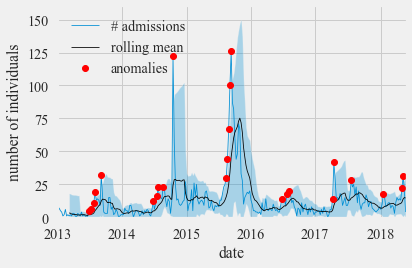

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-30      5.0
2013-07-14      6.0
2013-07-28     11.0
2013-08-04     19.0
2013-09-08     32.0
2014-06-29     12.0
2014-07-20     16.0
2014-07-27     23.0
2014-08-24     23.0
2014-10-19    122.0
2015-08-16     30.0
2015-08-23     44.0
2015-08-30     67.0
2015-09-06    100.0
2015-09-13    126.0
2016-06-26     14.0
2016-07-24     18.0
2016-08-07     20.0
2017-04-09     14.0
2017-04-16     42.0
2017-07-23     28.0
2018-01-21     18.0
2018-05-06     22.0
2018-05-13     31.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-06-27     19.0
2014-07-12     38.0
2014-07-27     35.0
2014-10-10    171.0
2015-08-06     68.0
2015-08-21    160.0
2015-09-05    236.0
2017-04-12     74.0
2018-05-07     54.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-07-31     67.0
2014-08-31     78.0
2014-10-31    210.0
2015-08-31    194.0
2015-09-30    400.0
2017-04-30    105.0
Name: anomalies, dtype: float64


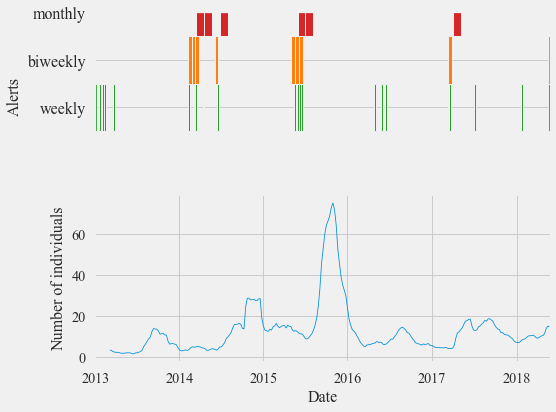

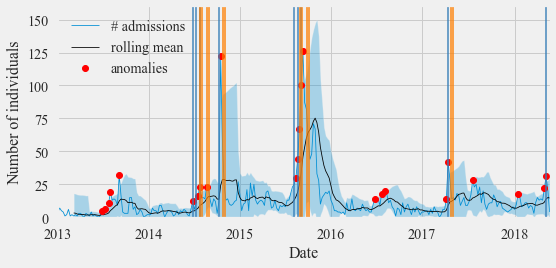

In [32]:
bird_list = ['Loon', 'Grebe']
d = data[pd.notnull(data['family'])]
families = ['Gaviidae', 'Podicipedidae', 'Laridae', 'Alcidae', 'Phalacrocoracidae', 'Pelecanidae', 'Scolopacidae']
centers = ['Santa Barbara Wildlife Care Network', 
          'Project Wildlife', 
          'California Wildlife Center',
          'Ojai Raptor Center',
          'Pasadena Humane Society and SPCA', 
          'Wildlife Care of So Cal', 
          'San Diego Humane society']
df_s = d[d['family'].str.contains('|'.join(families))]
#df_s = df_s[df_s['Organization'].str.contains('|'.join(centers))]
df_s.Organization.value_counts()
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='stranded', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False, adjusted = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/Loon_Grebe_Stranding.svg", dpi = 600)
plt.show()


ana_week_marine = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='stranded', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False, adjusted = False)
ana_biweek_marine = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='stranded', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False, adjusted = False)
ana_month_marine = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='stranded', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False, adjusted = False)

Loon_Grebe = pd.concat([ana_week_marine, ana_biweek_marine.anomalies, ana_month_marine.anomalies], axis = 1)
Loon_Grebe.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
Loon_Grebe.to_csv('Gantt_chart_Loon_Grebe_Stranding.csv')
ana_week_marine.to_csv('Weekly_Loon_Grebe_Stranding.csv')
ana_biweek_marine.to_csv('Biweekly_Loon_Grebe_Stranding.csv')
ana_month_marine.to_csv('Monthly_Loon_Grebe_Stranding.csv')

a= Loon_Grebe[(Loon_Grebe.anomaliesW>0)|(Loon_Grebe.anomaliesBIW>0)|(Loon_Grebe.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

#Weekly = pd.read_csv('Weekly.csv')
#G.columns = ['Alert', 'Start', 'Finish', 'Task']
# Declaring a figure "gnt" 
f = 16
fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(8, 6)) 
#fig = plt.figure(figsize=(6, 4))
#fig, (gnt) = plt.subplots() 
# Setting Y-axis limits 
#plt.ylim(0, 3)
gnt.set_ylim(0, 3) 
  
# Setting X-axis limits 
#plt.xlim(0, 511)
gnt.set_xlim(0, number_days) 
  
# Setting labels for x-axis and y-axis 
#gnt.set_xlabel('Date') 
gnt.set_ylabel('Alerts', fontsize = f) 
  
# Setting ticks on y-axis 
gnt.set_yticks([15, 25, 35]) 
# Labelling tickes of y-axis 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

# Setting ticks on y-axis 
#gnt.set_xticks([0, 151, 366, 510]) 
# Labelling tickes of y-axis 
#gnt.set_xticklabels(['2017', 'June 2017', '2018', 'May 2018']) 
gnt.axes.get_xaxis().set_ticks([])  
# Setting graph attribute 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
# Declaring a bar in schedule 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
ana_week_marine['rolling mean'].plot(ax=ax)
ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()

a_marine = a
fig, ax = plt.subplots(1, 1, sharex= False, figsize=(8, 4)) 
ana_week_marine['# admissions'].plot(ax= ax,label='# admissions')
ana_week_marine['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_marine['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_marine.index,ana_week_marine['rolling mean']+2*(ana_week_marine['rolling std']), 
                ana_week_marine['rolling mean']-2*(ana_week_marine['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
for bw in a_marine[a_marine.anomaliesBIW.notna()].index.values:
    ax.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_marine[a_marine.anomaliesM.notna()].index.values:
    ax.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()


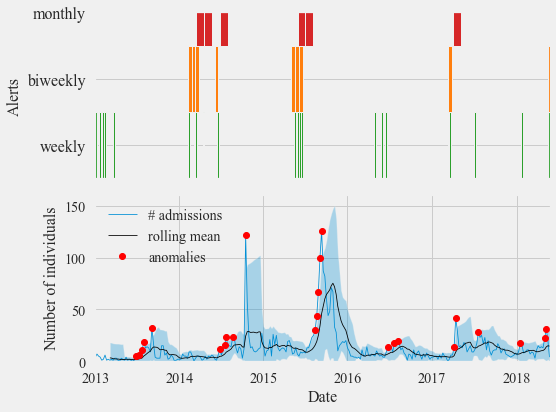

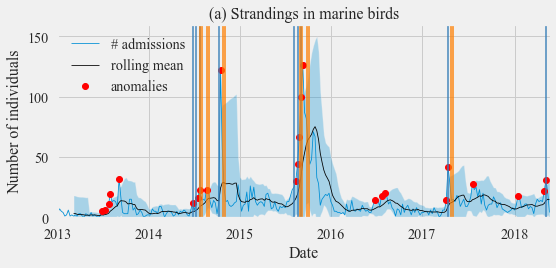

In [33]:
from matplotlib.ticker import LinearLocator
fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(8, 6)) 
#fig = plt.figure(figsize=(6, 4))
#fig, (gnt) = plt.subplots() 
# Setting Y-axis limits 
#plt.ylim(0, 3)
gnt.set_ylim(0, 3) 
  
# Setting X-axis limits 
#plt.xlim(0, 511)
gnt.set_xlim(0, number_days) 
  
# Setting labels for x-axis and y-axis 
#gnt.set_xlabel('Date') 
gnt.set_ylabel('Alerts', fontsize = f) 
  
# Setting ticks on y-axis 
gnt.set_yticks([15, 25, 35]) 
# Labelling tickes of y-axis 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
# Declaring a bar in schedule 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
gnt.set_ylim(10)
#gnt.xaxis.set_major_locator(LinearLocator(4.87))
        
ana_week_marine['# admissions'].plot(ax= ax,label='# admissions')
ana_week_marine['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_marine['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_marine.index,ana_week_marine['rolling mean']+2*(ana_week_marine['rolling std']), 
                ana_week_marine['rolling mean']-2*(ana_week_marine['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()
plt.show()


a_marine = a
fig, ax = plt.subplots(1, 1, sharex= False, figsize=(8, 4)) 
ana_week_marine['# admissions'].plot(ax= ax,label='# admissions')
ana_week_marine['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_marine['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_marine.index,ana_week_marine['rolling mean']+2*(ana_week_marine['rolling std']), 
                ana_week_marine['rolling mean']-2*(ana_week_marine['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
for bw in a[a.anomaliesBIW.notna()].index.values:
    ax.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a[a.anomaliesM.notna()].index.values:
    ax.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
ax.set_title('(a) Strandings in marine birds', fontsize = f)
plt.tight_layout()


plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Gnatt_chart_Loon_Grebe_Stranding.svg' , dpi = 600)

In [34]:
def plot_example(df, ax, title):
    df['# admissions'].plot(ax= ax,label='# admissions')
    df['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
    df['anomalies'].plot(style='ro', ax= ax,label='anomalies')


    ax.fill_between(df.index,df['rolling mean']+2*(df['rolling std']), 
                    df['rolling mean']-2*(df['rolling std']), alpha = 0.3)
    ax.set_ylim(0)
    ax.set_title(title)
    ax.set_ylabel('number of individuals')
    ax.set_xlabel('date')

In [35]:
len(data.common_name.unique())

130

In [36]:
df_s = data[data.Species.str.contains('|'.join(['Loon', 'Grebe']))]
df_s = df_s[df_s['Species'].notna()]
Loons_grebes = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='nutritional disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-10-06     2.0
2013-10-27     2.0
2013-11-03     3.0
2014-02-02     2.0
2014-04-13     2.0
2014-08-31     2.0
2014-09-28     2.0
2014-10-12     4.0
2014-10-19    18.0
2015-02-15    18.0
2015-06-21     4.0
2015-10-11     9.0
2015-10-18     8.0
2015-10-25    28.0
2016-10-23     3.0
2016-10-30     8.0
2017-04-16     3.0
2017-08-27     3.0
2017-10-22     5.0
2018-04-08     4.0
Name: anomalies, dtype: float64


In [37]:
## loons and grebes
bird_list = ['Loon', 'Grebe']
### Occular disease in Finches

df_s = data[(data.family == "Fringillidae")]
Finches = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='ocular disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

#### Neurological disease in Coopers's Hawk

df_s = data[(data.Species == "Cooper's Hawk")]
Coopers = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

### Neurologic disease in Rock Pigeons

df_s = data[(data.Species == "Rock Dove or Common Pigeon or Rock Pigeon or Fan-Tail Pigeon or Fantail Pigeon")]
Rock = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

### Neurologic disease in Columbids (PPMV)

df_s = data[(data.family == "Columbidae")]
Columbids = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

### Nutritional disease in Double-crested cormorants (Starvation)

df_s = data[(data.Species == "Double-crested Cormorant")]
Cormorant = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='nutritional disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

### Neurologic disease in Raccoons (Bromethelin toxicity)

df_s = data[(data.Species == "Northern Raccoon or Raccoon")]
Raccoon = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
doves = ["Eurasian Collared-dove or Collared Dove", 'Ring-necked Dove or Cape Turtle Dove or Ringed-necked Dove']
df_s = data[data.Species.isin(doves)]
Doves = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

marine_familiies = ['Laridae', 'Alcidae','Ardeidae','Podicipedidae'
                    'Phalacrocoracidae', 'Pelecanidae','Rallidae',
                    'Gaviidae','Scolopacidae',]
df_s = data[(data.family.isin(marine_familiies))]
Oil_birds = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='petrochemical exposure', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2014-03-30     2.0
2014-04-13     3.0
2014-04-20     8.0
2014-05-04     8.0
2014-12-28     5.0
2015-01-04    18.0
2016-01-24     6.0
2016-01-31    18.0
2016-02-07    19.0
2016-02-14    24.0
2017-01-15     6.0
2017-01-29    13.0
2017-02-12    15.0
2017-02-19    18.0
2017-03-05    22.0
2017-03-12    30.0
2018-02-18     4.0
2018-04-08     6.0
2018-04-15    13.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-05-26     2.0
2013-07-28     4.0
2014-06-15     3.0
2014-06-22     4.0
2014-07-06     7.0
2014-07-20     7.0
2015-04-19     1.0
2015-05-31     1.0
2015-06-21     6.0
2015-06-28     7.0
2016-06-12     2.0
2016-07-03     4.0
2016-07-10     7.0
2016-07-31     7.0
2017-01-29     3.0
2017-05-14     2.0
2017-06-25     6.0
2017-07-09     6.0
2017-07-16    10.0
2017-12-24     3.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-07-07     5.0
2013-09-29     5.0
2014-01-19     5.0
2014-05-04     5.0
2014-08-24    13.0
2015-05-03     8.0
2015-08-30    10.0
2016-04-24     6.0
2016-09-18     6.0
2016-11-13    12.0
2017-03-05    13.0
2017-05-28    13.0
2017-08-13    16.0
2018-04-01    12.0
2018-04-08    13.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-23     9.0
2013-09-08     8.0
2014-03-09     7.0
2014-03-30     9.0
2014-07-13    14.0
2014-07-20    16.0
2014-08-10    16.0
2014-08-24    22.0
2015-01-11     9.0
2015-04-05    13.0
2015-05-03    15.0
2015-08-30    21.0
2016-03-13     9.0
2016-03-20    16.0
2017-03-05    14.0
2017-04-02    15.0
2017-04-16    16.0
2017-04-23    19.0
2018-03-04    17.0
2018-03-18    20.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-25    1.0
2014-03-23    1.0
2014-08-31    1.0
2014-09-07    2.0
2015-02-08    1.0
2015-02-15    1.0
2015-07-26    3.0
2016-08-07    1.0
2016-08-21    1.0
2017-01-08    1.0
2017-01-15    1.0
2017-01-22    5.0
2018-01-28    1.0
2018-05-06    1.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-07-14    5.0
2014-06-01    6.0
2015-06-28    4.0
2015-07-12    8.0
2016-07-24    8.0
2017-04-23    7.0
2017-05-14    8.0
2017-11-26    6.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-11    1.0
2014-02-02    1.0
2014-02-16    1.0
2014-07-20    1.0
2015-03-22    1.0
2015-03-29    2.0
2015-08-23    4.0
2016-02-07    2.0
2016-03-06    4.0
2016-03-20    5.0
2017-02-12    2.0
2017-05-14    2.0
2017-09-10    5.0
2017-09-17    7.0
2018-03-18    3.0
2018-05-06    4.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-07-28     2.0
2013-08-25     6.0
2014-02-09     2.0
2014-02-16     5.0
2014-12-14     5.0
2015-01-04     8.0
2015-02-15    12.0
2015-09-06    16.0
2016-01-24     9.0
2016-11-20     4.0
2017-01-29     6.0
2017-04-30     9.0
2018-02-25     6.0
Name: anomalies, dtype: float64


In [38]:
Squirrels  = ["Bryant's Fox Squirrel or Delmarva Fox Squirrel or Eastern Fox Squirrel or Fox Squirrel", 
             "Belding's Ground Squirell or Belding's Ground Squirrel", 
             "Red-bellied Squirrel or American Red Squirrel",
             "Carolina Flying Squirrel or Northern Flying Squirrel",
             "Douglas's Squirrel or Douglas Squirrel or Chickaree", 
             "California Ground Squirrel",
             "Eastern Gray Squirrel or Gray Squirrel or Grey Squirrel or Eastern Grey Squirrel"]
df_s = data[data.Species.isin(Squirrels)]
Squirrel_ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-05-19     8.0
2013-06-16    10.0
2013-09-15    14.0
2014-04-13    10.0
2014-04-20    13.0
2014-04-27    18.0
2014-08-17    14.0
2014-09-07    18.0
2014-09-21    25.0
2015-03-29     8.0
2015-04-19    12.0
2015-05-10    17.0
2016-04-17    16.0
2016-09-04    22.0
2017-02-05    13.0
2017-09-17    27.0
2018-04-08    16.0
2018-04-15    16.0
2018-05-20    21.0
Name: anomalies, dtype: float64


In [39]:
Raccons_skunks  = ["Northern Raccoon or Raccoon", 
                   "Striped Skunk", "Eastern Spotted Skunk or Spotted Skunk"]
df_s = data[data.Species.isin(Raccons_skunks)]
Raccons_skunks_ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-30     8.0
2014-02-16     6.0
2014-06-29    10.0
2014-07-13     9.0
2015-02-08     5.0
2015-03-15     8.0
2015-07-12     9.0
2016-03-20     9.0
2016-06-05    12.0
2016-07-17    13.0
2017-04-23     9.0
2017-05-14    12.0
2018-05-13    14.0
Name: anomalies, dtype: float64


In [40]:
deer_familiies = ['Cervidae']
df_s = data[(data.family.isin(deer_familiies))]
Physical_deers = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='physical injury', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-09     3.0
2013-08-25     4.0
2013-09-08     8.0
2014-05-04     6.0
2015-03-15     3.0
2015-04-26     4.0
2015-06-07    13.0
2016-04-17     2.0
2016-05-29     4.0
2016-06-26     5.0
2016-07-03     6.0
2017-02-19     2.0
2017-06-11     4.0
2017-06-18     5.0
2018-04-15     2.0
2018-04-29     6.0
2018-05-20     7.0
Name: anomalies, dtype: float64


In [41]:
Foxes = ["Red Fox or Cross Fox"]
df_s = data[data.Species.isin(Foxes)]
Foxes_ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='physical injury', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-07-14    1.0
2014-06-01    1.0
2014-07-06    1.0
2014-10-12    1.0
2015-02-15    1.0
2015-05-17    1.0
2015-06-21    2.0
2016-06-12    1.0
2016-09-11    1.0
2018-05-20    1.0
Name: anomalies, dtype: float64


In [42]:
#Foxes = ["Red Fox or Cross Fox"]
#df_s = data[data.Species.isin(Foxes)]
#Foxes_ana = alert.plot_anomalies_data_specific(df = df_s,
#                                  syndrome='neu', sigma=2, window_size=10, 
#                                  time_bin = 'W', verbose = True, 
#                                  save = False)

In [43]:
Accipitridae  = ["Accipitridae"]
df_s = data[data.family.isin(Accipitridae)]
Accipitridae_ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome="neurologic disease", sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-06-23     7.0
2013-07-21    10.0
2013-07-28     9.0
2014-06-01     6.0
2014-07-06    13.0
2014-07-20    15.0
2015-05-31     5.0
2015-06-07     6.0
2015-06-21    11.0
2015-06-28    10.0
2015-07-05    12.0
2016-01-24     6.0
2016-02-14     7.0
2016-05-22     7.0
2016-05-29     8.0
2016-06-12    11.0
2016-06-26    12.0
2017-05-28    10.0
2017-06-25    13.0
2017-07-16    14.0
2017-12-24    10.0
2018-01-21    12.0
Name: anomalies, dtype: float64


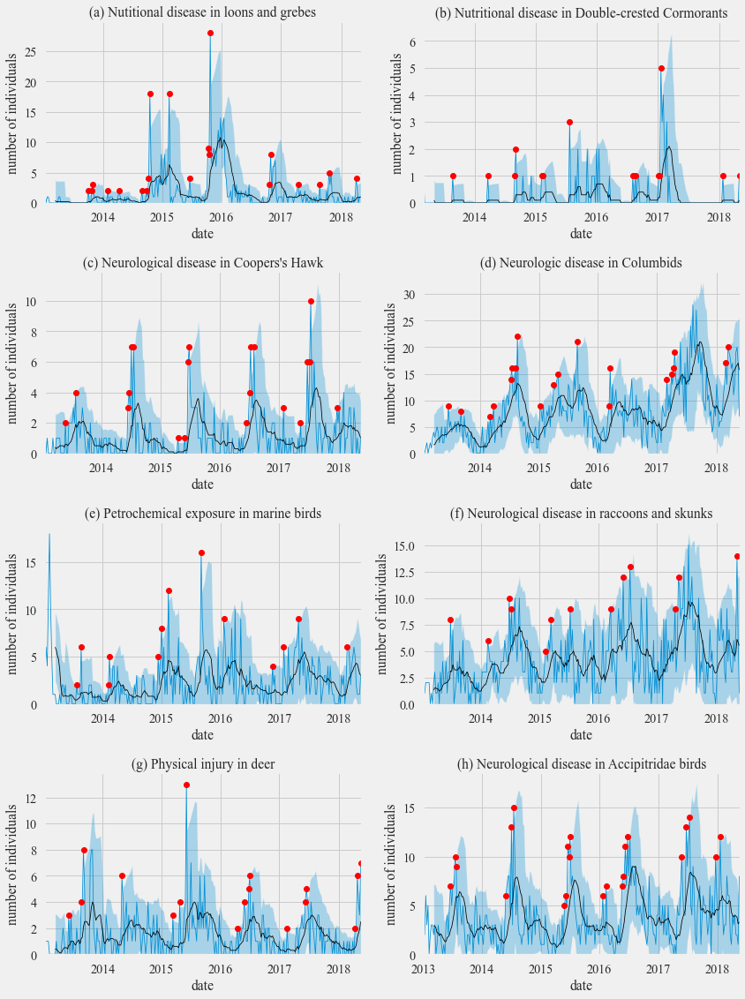

In [44]:
import matplotlib.gridspec as gridspec
from matplotlib.pyplot import *
# activate latex text rendering
rc('text', usetex=False)

#plt.title("This is title number: " + r"\textbf{" + str(number) + "}")
fig2, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(12, 16), sharex= False, sharey =  False)
plot_example(df= Loons_grebes, ax=ax1, title='(a) Nutitional disease in loons and grebes')
plot_example(df= Cormorant, ax=ax2, title="(b) Nutritional disease in Double-crested Cormorants")
plot_example(df= Coopers, ax=ax3, title="(c) Neurological disease in Coopers's Hawk")
plot_example(df= Columbids, ax=ax4, title="(d) Neurologic disease in Columbids")
plot_example(df= Oil_birds, ax=ax5, title="(e) Petrochemical exposure in marine birds")
plot_example(df= Raccons_skunks_ana, ax=ax6, title="(f) Neurological disease in raccoons and skunks")
plot_example(df= Physical_deers, ax=ax7, title="(g) Physical injury in deer")
plot_example(df= Accipitridae_ana, ax=ax8, title= "(h) Neurological disease in Accipitridae birds")
#r"(h) Neurological cases in $\mathbf{Accipitridae}$ birds"
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure_r1.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure_r1.svg' , dpi = 600)
plt.show()

In [45]:
def plot_example(df, ax, title, T):
    df['# admissions'].plot(ax= ax,label='# admissions')
    df['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
    df['anomalies'].plot(style='ro', ax= ax,label='anomalies')


    ax.fill_between(df.index,df['rolling mean']+2*(df['rolling std']), 
                    df['rolling mean']-2*(df['rolling std']), alpha = 0.3)
    ax.set_ylim(0)
    ax.set_title(T,fontsize = 16, fontweight="bold",  x=0.5, y=0.9)
    ax.text(s = title, x=0.01, y=0.7,fontsize = 20, fontweight="bold", horizontalalignment= 'left', transform=ax.transAxes)
    #ax == ax1 | ax == ax5:
    
    ax.set_xlabel('date')

In [46]:
Golden  = ["Golden Eagle"]
df_s = data[data.Species.isin(Golden)]
Golden_ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome="neurologic disease", sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2015-01-25    1.0
2015-04-12    1.0
2016-01-31    1.0
2017-07-02    1.0
Name: anomalies, dtype: float64


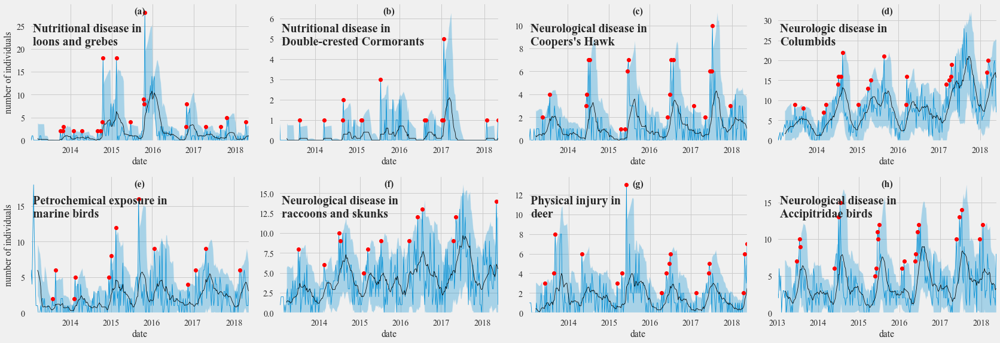

In [47]:
import matplotlib.gridspec as gridspec
from matplotlib.pyplot import *
# activate latex text rendering
rc('text', usetex=False)

#plt.title("This is title number: " + r"\textbf{" + str(number) + "}")
fig2, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(11.75*2, 8.25*1), sharex= False, sharey =  False)
plot_example(df= Loons_grebes, ax=ax1, title='Nutritional disease in\nloons and grebes', T = "(a)")
plot_example(df= Cormorant, ax=ax2, title="Nutritional disease in\nDouble-crested Cormorants", T = "(b)")
plot_example(df= Coopers, ax=ax3, title="Neurological disease in\nCoopers's Hawk", T = "(c)")
plot_example(df= Columbids, ax=ax4, title="Neurologic disease in\nColumbids", T = "(d)")
plot_example(df= Oil_birds, ax=ax5, title="Petrochemical exposure in\nmarine birds", T = "(e)")
plot_example(df= Raccons_skunks_ana, ax=ax6, title="Neurological disease in\nraccoons and skunks", T = "(f)")
plot_example(df= Physical_deers, ax=ax7, title="Physical injury in\ndeer", T = "(g)")
plot_example(df= Accipitridae_ana, ax=ax8, title= "Neurological disease in\nAccipitridae birds", T = "(h)")
ax1.set_ylabel('number of individuals')
ax2.set_ylabel('')
ax3.set_ylabel('')
ax4.set_ylabel('')
ax5.set_ylabel('number of individuals')
ax6.set_ylabel('')
ax7.set_ylabel('')
ax8.set_ylabel('')
#r"(h) Neurological cases in $\mathbf{Accipitridae}$ birds"
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure_r1_v3.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure_r1_v3.svg' , dpi = 600)
plt.show()

In [48]:
def plot_example(df, ax, title):
    df['# admissions'].plot(ax= ax,label='# admissions')
    df['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
    df['anomalies'].plot(style='ro', ax= ax,label='anomalies')


    ax.fill_between(df.index,df['rolling mean']+2*(df['rolling std']), 
                    df['rolling mean']-2*(df['rolling std']), alpha = 0.3)
    ax.set_ylim(0)
    ax.set_title(title,fontsize = 16, x=0.5, y=0.9)
    #ax.text(s = title, x=0.01, y=0.7,fontsize = 20, fontweight="bold", horizontalalignment= 'left', transform=ax.transAxes)
    #ax == ax1 | ax == ax5:
    
    ax.set_xlabel('date')

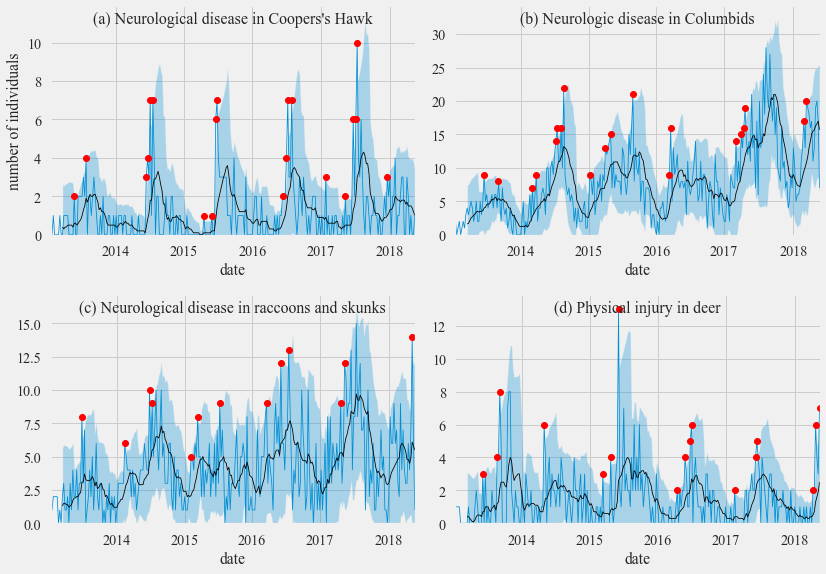

In [49]:
import matplotlib.gridspec as gridspec
from matplotlib.pyplot import *
# activate latex text rendering
rc('text', usetex=False)

#plt.title("This is title number: " + r"\textbf{" + str(number) + "}")
fig2, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11.75*1, 8.25*1), sharex= False, sharey =  False)
plot_example(df= Coopers, ax=ax1, title="(a) Neurological disease in Coopers's Hawk")
plot_example(df= Columbids, ax=ax2, title="(b) Neurologic disease in Columbids")
plot_example(df= Raccons_skunks_ana, ax=ax3, title="(c) Neurological disease in raccoons and skunks")
plot_example(df= Physical_deers, ax=ax4, title="(d) Physical injury in deer")
ax1.set_ylabel('number of individuals')
ax2.set_ylabel('')
ax3.set_ylabel('')
ax4.set_ylabel('')
ax5.set_ylabel('number of individuals')
ax6.set_ylabel('')
ax7.set_ylabel('')
ax8.set_ylabel('')
#r"(h) Neurological cases in $\mathbf{Accipitridae}$ birds"
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure4_r1_v4.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure4_r1_v4.svg' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure4_r1_v4.pdf' , dpi = 600)
plt.show()

In [51]:
def plot_example(df, ax, title, T):
    df['# admissions'].plot(ax= ax,label='# admissions')
    df['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
    df['anomalies'].plot(style='ro', ax= ax,label='anomalies')


    ax.fill_between(df.index,df['rolling mean']+2*(df['rolling std']), 
                    df['rolling mean']-2*(df['rolling std']), alpha = 0.3)
    ax.set_ylim(0)
    ax.set_title(T,fontsize = 16, fontweight="bold",  x=0.5, y=0.9)
    ax.text(s = title, x=0.01, y=0.7,fontsize = 20, fontweight="bold", horizontalalignment= 'left', transform=ax.transAxes)
    #ax == ax1 | ax == ax5:
    
    ax.set_xlabel('date')

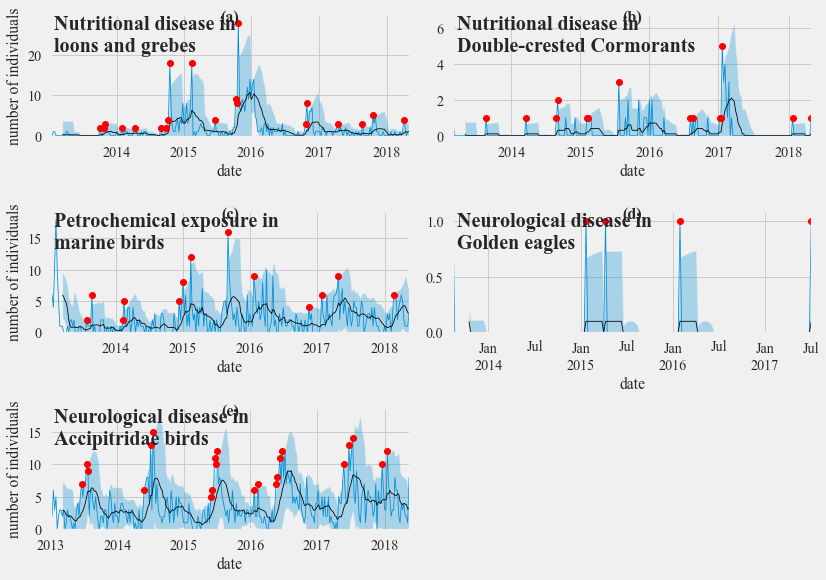

In [52]:
import matplotlib.gridspec as gridspec
from matplotlib.pyplot import *
# activate latex text rendering
rc('text', usetex=False)

#plt.title("This is title number: " + r"\textbf{" + str(number) + "}")
fig2, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(11.75*1, 8.25*1), sharex= False, sharey =  False)
plot_example(df= Loons_grebes, ax=ax1, title='Nutritional disease in\nloons and grebes', T = "(a)")
plot_example(df= Cormorant, ax=ax2, title="Nutritional disease in\nDouble-crested Cormorants", T = "(b)")
plot_example(df= Oil_birds, ax=ax3, title="Petrochemical exposure in\nmarine birds", T = "(c)")
plot_example(df= Golden_ana, ax=ax4, title="Neurological disease in\nGolden eagles", T = "(d)")
plot_example(df= Accipitridae_ana, ax=ax5, title= "Neurological disease in\nAccipitridae birds", T = "(e)")

ax1.set_ylabel('number of individuals')
ax2.set_ylabel('')
ax3.set_ylabel('')
ax4.set_ylabel('')
ax5.set_ylabel('number of individuals')
ax3.set_ylabel('number of individuals')
ax6.axis('off')
#r"(h) Neurological cases in $\mathbf{Accipitridae}$ birds"
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/FigureS2_r1_v2.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/FigureS2_r1_v2.svg' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/FigureS2_r1_v2.pdf' , dpi = 600)
plt.show()

In [53]:
data[data.Species.str.contains('dove')].Species.unique()

array(['Eurasian Collared-dove or Collared Dove',
       'African Collared-dove or Barbary Dove or African Collared Dove or Ringed Turtle-dove or Rose-grey Dove',
       'Common Ground-dove or Common Ground Dove'], dtype=object)

In [54]:
def plot_example(df, ax, title):
    df['# admissions'].plot(ax= ax,label='# admissions')
    df['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
    df['anomalies'].plot(style='ro', ax= ax,label='anomalies')


    ax.fill_between(df.index,df['rolling mean']+2*(df['rolling std']), 
                    df['rolling mean']-2*(df['rolling std']), alpha = 0.3)
    ax.set_ylim(0)
    ax.set_title(title)
    ax.set_ylabel('number of individuals')
    ax.set_xlabel('date')

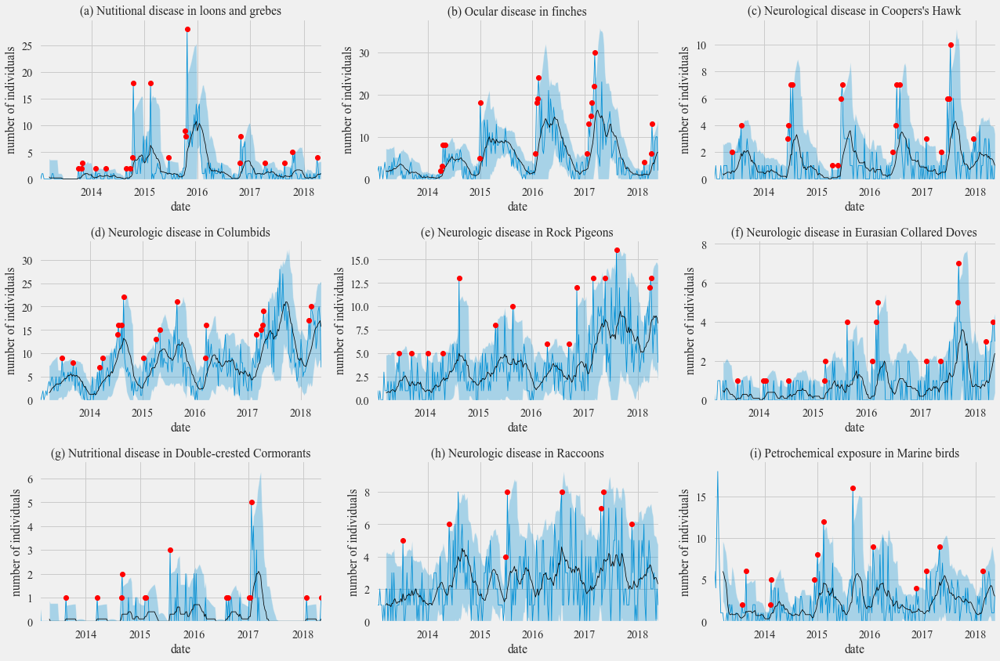

In [55]:
import matplotlib.gridspec as gridspec
fig2, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(18, 12), sharex= False, sharey =  False)
#fig2 = plt.figure(constrained_layout=True, figsize=(18, 12))
#spec2 = gridspec.GridSpec(ncols=3, nrows=3, figure=fig2, share)
#ax1 = fig2.add_subplot(spec2[0, 0])
plot_example(df= Loons_grebes, ax=ax1, title='(a) Nutitional disease in loons and grebes')
#ax2 = fig2.add_subplot(spec2[0, 1])
plot_example(df= Finches, ax=ax2, title='(b) Ocular disease in finches')
#ax3 = fig2.add_subplot(spec2[0, 2])
plot_example(df= Coopers, ax=ax3, title="(c) Neurological disease in Coopers's Hawk")
#ax4 = fig2.add_subplot(spec2[1, 0])
plot_example(df= Columbids, ax=ax4, title="(d) Neurologic disease in Columbids")
#ax6 = fig2.add_subplot(spec2[1, 2])
plot_example(df= Rock, ax=ax5, title="(e) Neurologic disease in Rock Pigeons")
#ax5 = fig2.add_subplot(spec2[1, 1])
plot_example(df= Doves, ax=ax6, title="(f) Neurologic disease in Eurasian Collared Doves")
#ax5 = fig2.add_subplot(spec2[1, 1])
plot_example(df= Cormorant, ax=ax7, title="(g) Nutritional disease in Double-crested Cormorants")
#ax7 = fig2.add_subplot(spec2[2, 0])
plot_example(df= Raccoon, ax=ax8, title="(h) Neurologic disease in Raccoons")
#ax8.axis('off')
plot_example(df= Oil_birds, ax=ax9, title="(i) Petrochemical exposure in Marine birds")
plt.tight_layout()
#plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure.png' , dpi = 600)
#plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure.svg' , dpi = 600)
plt.show()

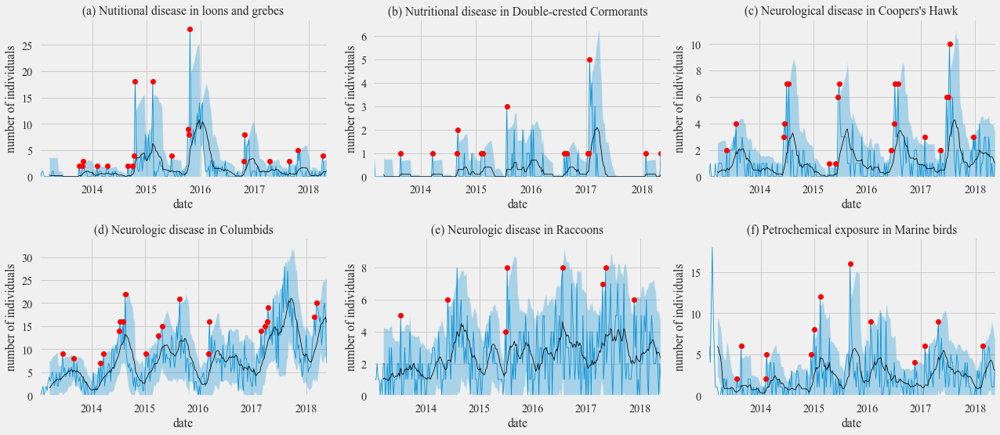

In [56]:
import matplotlib.gridspec as gridspec
fig2, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(18, 8), sharex= False, sharey =  False)
#fig2 = plt.figure(constrained_layout=True, figsize=(18, 12))
#spec2 = gridspec.GridSpec(ncols=3, nrows=3, figure=fig2, share)
#ax1 = fig2.add_subplot(spec2[0, 0])
plot_example(df= Loons_grebes, ax=ax1, title='(a) Nutitional disease in loons and grebes')
#ax2 = fig2.add_subplot(spec2[0, 1])
plot_example(df= Cormorant, ax=ax2, title="(b) Nutritional disease in Double-crested Cormorants")
#ax7 = fig2.add_subplot(spec2[2, 0])
plot_example(df= Coopers, ax=ax3, title="(c) Neurological disease in Coopers's Hawk")
#ax4 = fig2.add_subplot(spec2[1, 0])
plot_example(df= Columbids, ax=ax4, title="(d) Neurologic disease in Columbids")
#ax5 = fig2.add_subplot(spec2[1, 1])
plot_example(df= Raccoon, ax=ax5, title="(e) Neurologic disease in Raccoons")
#ax8.axis('off')
plot_example(df= Oil_birds, ax=ax6, title="(f) Petrochemical exposure in Marine birds")
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Example_figure.svg' , dpi = 600)
plt.show()

In [57]:
data[data.Species.str.contains('Rock')].Species.unique()

array(['Rock Dove or Common Pigeon or Rock Pigeon or Fan-Tail Pigeon or Fantail Pigeon',
       'Rock Ptarmigan or Ptarmigan'], dtype=object)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-04     5.0
2014-02-23     5.0
2014-08-24    14.0
2015-08-30    10.0
2016-04-24     5.0
2016-11-13    13.0
2017-02-05    11.0
2017-05-28    14.0
2018-04-01    16.0
Name: anomalies, dtype: float64


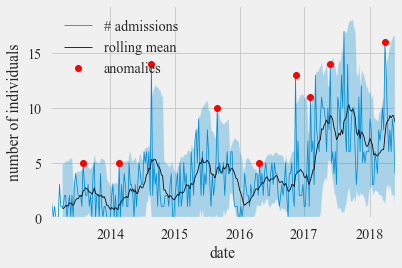

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-04     5.0
2014-02-23     5.0
2014-08-24    14.0
2015-08-30    10.0
2016-04-24     5.0
2016-11-13    13.0
2017-02-05    11.0
2017-05-28    14.0
2018-04-01    16.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-06-09     9.0
2014-06-24     9.0
2014-07-09    10.0
2014-07-24    14.0
2014-08-08    16.0
2015-04-20    16.0
2016-11-10    17.0
2017-03-25    23.0
2018-03-20    26.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-07-31    23.0
2014-08-31    25.0
2016-11-30    25.0
2017-02-28    27.0
2017-03-31    38.0
2017-04-30    43.0
2017-08-31    53.0
Name: anomalies, dtype: float64


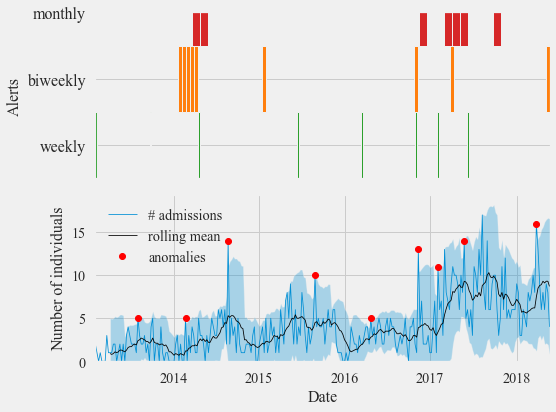

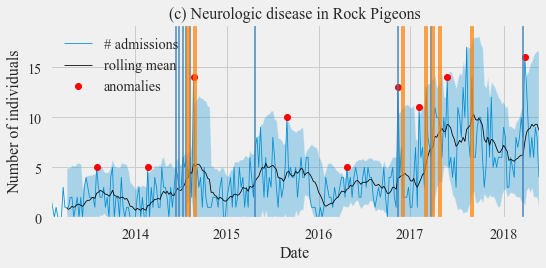

In [58]:
bird_list = ['Rock Dove or Common Pigeon or Rock Pigeon or Fan-Tail Pigeon or Fantail Pigeon']
d = data[pd.notnull(data['family'])]
#families = ['Gaviidae', 'Podicipedidae', 'Laridae', 'Alcidae', 'Phalacrocoracidae', 'Pelecanidae', 'Scolopacidae']
#centers = ['Santa Barbara Wildlife Care Network', 
#          'Project Wildlife', 
#          'California Wildlife Center',
#          'Ojai Raptor Center',
#          'Pasadena Humane Society and SPCA', 
#          'Wildlife Care of So Cal', 
#          'San Diego Humane society']

df_s = d[d['Species'].str.contains('|'.join(bird_list))]
#df_s = df_s[df_s['Organization'].str.contains('|'.join(centers))]
df_s.Organization.value_counts()
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False, adjusted = False)
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/RockPigeons_Neurological.svg", dpi = 600)
plt.show()


ana_week_rock = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False, adjusted = False)
ana_biweek_rock = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False, adjusted = False)
ana_month_rock = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False, adjusted = False)

Loon_Grebe = pd.concat([ana_week_rock, ana_biweek_rock.anomalies, ana_month_rock.anomalies], axis = 1)
Loon_Grebe.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']
Loon_Grebe.to_csv('Gantt_chart_RockPigeons.csv')
ana_week_rock.to_csv('Weekly_RockPigeons.csv')
ana_biweek_rock.to_csv('Biweekly_RockPigeons.csv')
ana_month_rock.to_csv('Monthly_RockPigeons.csv')

a= Loon_Grebe[(Loon_Grebe.anomaliesW>0)|(Loon_Grebe.anomaliesBIW>0)|(Loon_Grebe.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(8, 6)) 
gnt.set_ylim(0, 3) 
gnt.set_xlim(0, number_days) 
  
gnt.set_ylabel('Alerts', fontsize = f) 
  
gnt.set_yticks([15, 25, 35]) 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
gnt.set_ylim(10)
       
ana_week_rock['# admissions'].plot(ax= ax,label='# admissions')
ana_week_rock['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_rock['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_rock.index,ana_week_rock['rolling mean']+2*(ana_week_rock['rolling std']), 
                ana_week_rock['rolling mean']-2*(ana_week_rock['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()
plt.show()
a_rock = a
fig, ax = plt.subplots(1, 1, sharex= False, figsize=(8, 4)) 
ana_week_rock['# admissions'].plot(ax= ax,label='# admissions')
ana_week_rock['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_rock['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_rock.index,ana_week_rock['rolling mean']+2*(ana_week_rock['rolling std']), 
                ana_week_rock['rolling mean']-2*(ana_week_rock['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
for bw in a_rock[a_rock.anomaliesBIW.notna()].index.values:
    ax.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_rock[a_rock.anomaliesM.notna()].index.values:
    ax.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
ax.set_title('(c) Neurologic disease in Rock Pigeons', fontsize = f)
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Gnatt_chart_RockPigeons.svg' , dpi = 600)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-11    1.0
2014-02-02    1.0
2014-02-16    1.0
2014-07-20    1.0
2015-03-22    1.0
2015-03-29    2.0
2015-08-23    4.0
2016-02-07    2.0
2016-03-06    4.0
2016-03-20    5.0
2017-02-12    2.0
2017-05-14    2.0
2017-09-10    5.0
2017-09-17    7.0
2018-03-18    3.0
2018-05-06    4.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2013-08-11    1.0
2013-09-15    2.0
2014-02-02    1.0
2015-03-29    3.0
2015-08-09    2.0
2015-08-23    4.0
2016-02-07    3.0
2016-03-06    5.0
2016-03-20    5.0
2016-07-31    3.0
2017-09-17    7.0
2018-03-18    3.0
2018-05-06    6.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-08-22     3.0
2015-03-20     4.0
2016-02-28     6.0
2017-09-05    13.0
Name: anomalies, dtype: float64
Weekly admissions


number of admissions triggering alert
Admitted_at
2014-09-30     4.0
2015-03-31     5.0
2015-08-31     7.0
2015-10-31     8.0
2016-03-31    13.0
2017-08-31    11.0
2017-09-30    19.0
Name: anomalies, dtype: float64


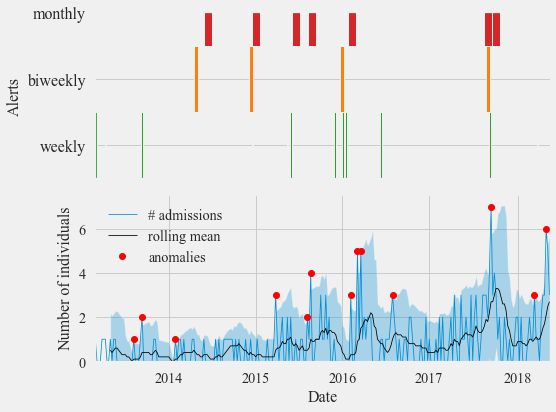

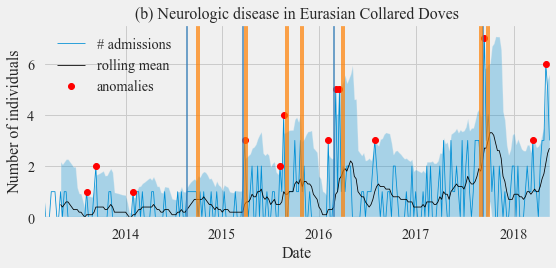

In [59]:
doves = ["Eurasian Collared-dove or Collared Dove", 'Ring-necked Dove or Cape Turtle Dove or Ringed-necked Dove']
df_s = data[data.Species.isin(doves)]
ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)
"""
fig, ax = plt.subplots(figsize = (6,4))
ana['# admissions'].plot(ax= ax,label='# admissions')
ana['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana.index,ana['rolling mean']+2*(ana['rolling std']), 
                ana['rolling mean']-2*(ana['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
plt.tight_layout()
#plt.savefig("C:/Users/falco/Desktop/directory/WRMD_paper/outputs/RockPigeons_Neurological.svg", dpi = 600)
plt.show()
"""

ana_week_eurasian_dove = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False, adjusted = False)
ana_biweek_eurasian_dove = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = '15D', verbose = True, 
                                  save = False, adjusted = False)
ana_month_eurasian_dove = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome='neurologic disease', sigma=2, window_size=10, 
                                  time_bin = 'M', verbose = True, 
                                  save = False, adjusted = False)

Loon_Grebe = pd.concat([ana_week_eurasian_dove, ana_biweek_eurasian_dove.anomalies, ana_month_eurasian_dove.anomalies], axis = 1)
Loon_Grebe.columns = ['# admissions', 'rolling mean', 'std', 'residual', 'rolling std', 'anomaliesW', 'anomaliesBIW', 'anomaliesM']

a= Loon_Grebe[(Loon_Grebe.anomaliesW>0)|(Loon_Grebe.anomaliesBIW>0)|(Loon_Grebe.anomaliesM>0)]
max_date= a.index.max()
min_date= a.index.min()
number_days = (max_date-min_date).days
Type = []
START = []
END = [] 
for index, row in a.iterrows():
    if row.anomaliesW>0:
        Type.append('Weekly')
        START.append((index-min_date).days)#
        END.append(7)
    if row.anomaliesBIW>0:
        Type.append('Biweekly')
        START.append((index-min_date).days)
        END.append(15)
    if row.anomaliesM>0:
        Type.append('Monthly')
        START.append((index-min_date).days)
        END.append(30)
        
b = pd.DataFrame({'Type': Type, 'START': START, 'W': END})
b.head()

fig, (gnt, ax) = plt.subplots(2, 1, sharex= False, figsize=(8, 6)) 
gnt.set_ylim(0, 3) 
gnt.set_xlim(0, number_days) 
  
gnt.set_ylabel('Alerts', fontsize = f) 
  
gnt.set_yticks([15, 25, 35]) 
gnt.set_yticklabels(['weekly', 'biweekly', 'monthly'], fontsize = f) 

gnt.axes.get_xaxis().set_visible(False) 
gnt.grid(True) 
for index, row in b.iterrows():
    if row.Type == 'Weekly':
        gnt.broken_barh([(row.START, row.W)], (10, 10), facecolors =('tab:green'))
    if row.Type == 'Biweekly':
        gnt.broken_barh([(row.START, row.W)], (20, 10), facecolors =('tab:orange'))
    if row.Type == 'Monthly':
        gnt.broken_barh([(row.START, row.W)], (30, 10), facecolors =('tab:red'))
gnt.set_ylim(10)
       
ana_week_eurasian_dove['# admissions'].plot(ax= ax,label='# admissions')
ana_week_eurasian_dove['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_eurasian_dove['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_eurasian_dove.index,ana_week_eurasian_dove['rolling mean']+2*(ana_week_eurasian_dove['rolling std']), 
                ana_week_eurasian_dove['rolling mean']-2*(ana_week_eurasian_dove['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
plt.tight_layout()
plt.show()
a_eurasian_dove = a
fig, ax = plt.subplots(1, 1, sharex= False, figsize=(8, 4)) 
ana_week_eurasian_dove['# admissions'].plot(ax= ax,label='# admissions')
ana_week_eurasian_dove['rolling mean'].plot(ax= ax,label='rolling mean', color = 'black')
ana_week_eurasian_dove['anomalies'].plot(style='ro', ax= ax,label='anomalies')


ax.fill_between(ana_week_eurasian_dove.index,ana_week_eurasian_dove['rolling mean']+2*(ana_week_eurasian_dove['rolling std']), 
                ana_week_eurasian_dove['rolling mean']-2*(ana_week_eurasian_dove['rolling std']), alpha = 0.3)
ax.set_ylim(0)
plt.legend(loc='upper left')
ax.set_ylabel('number of individuals')
ax.set_xlabel('date')
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesBIW.notna()].index.values:
    ax.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesM.notna()].index.values:
    ax.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax.set_xlabel('Date', fontsize = f)
ax.set_ylabel('Number of individuals', fontsize = f)
ax.set_title('(b) Neurologic disease in Eurasian Collared Doves', fontsize = f)
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Gnatt_chart_EurasianCollaredDove.svg' , dpi = 600)

In [60]:
Osprey  = ["Osprey"]
df_s = data[data.Species.isin(Osprey)]
Osprey_ana = alert.plot_anomalies_data_specific(df = df_s,
                                  syndrome=None, sigma=2, window_size=10, 
                                  time_bin = 'W', verbose = True, 
                                  save = False)

Weekly admissions


number of admissions triggering alert
Admitted_at
2013-12-01    2.0
2014-04-06    1.0
2014-05-25    4.0
2015-03-15    1.0
2015-05-10    2.0
2015-06-07    2.0
2015-07-05    3.0
2016-03-20    3.0
2016-07-31    3.0
2016-11-20    1.0
2017-03-05    1.0
2017-03-19    1.0
2017-06-25    2.0
2017-07-09    4.0
2017-11-19    2.0
2018-03-25    1.0
2018-04-01    3.0
Name: anomalies, dtype: float64


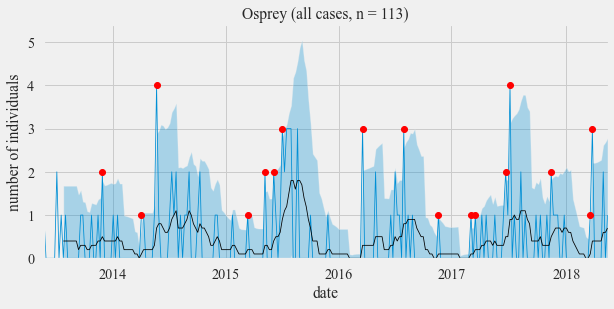

In [61]:
fig, ax1 = plt.subplots(1,1, figsize = (9,4))
plot_example(df= Osprey_ana, ax=ax1, title="Osprey (all cases, n = 113)")
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Osprey.svg' , dpi = 600)

In [62]:
data.Species.value_counts()[data.Species.value_counts()>35]

Virginia Opossum                                17496
Mallard                                         14193
House Finch                                     13375
Mourning Dove or American Mourning Dove         10883
American Crow                                    9793
                                                ...  
Greater Roadrunner                                 38
Long-tailed Weasel                                 38
Thayer's Gull                                      37
Common Yellowthroat                                36
Red Bat or Western Red Bat or Desert Red Bat       36
Name: Species, Length: 197, dtype: int64

In [63]:
df_s[df_s.prediction_adjusted == 'neurologic disease']

,Unnamed: 0,Admitted_at,WRMD_ID,Case,Admitted_at.1,Species,Organization,Reasons,Address_found,Latitude,...,prediction_adjusted,Unnamed: 0.1,Training_data_name,common_name,genus,species,family,order,ScientificName,prediction_str_rm
Admitted_at,,,,,,,,,,,,,,,,,,,,,
2017-11-16,213371,2017-11-16,812675,17-3915,2017-11-16,Osprey,California Wildlife Center,Broken wing,"Oxnard, Water Treatment District Oxnard CA",34.145465,...,neurologic disease,71.0,Osprey,Osprey,Pandion,haliaetus,Pandionidae,Accipitriformes,Pandion haliaetus,neurologic disease
2017-11-02,213372,2017-11-02,807450,17-3865,2017-11-02,Osprey,California Wildlife Center,"walked out of the lake, standing, couldn't fly",23168 park Sorrento Calabasas CA,34.152046,...,neurologic disease,71.0,Osprey,Osprey,Pandion,haliaetus,Pandionidae,Accipitriformes,Pandion haliaetus,neurologic disease
2016-07-02,213401,2016-07-02,501415,16-590,2016-07-02,Osprey,Sonoma County Wildlife Rescue,Standing in road and shaking,Moscow Rd Monte Rio CA,38.466741,...,neurologic disease,71.0,Osprey,Osprey,Pandion,haliaetus,Pandionidae,Accipitriformes,Pandion haliaetus,neurologic disease
2016-04-27,213403,2016-04-27,422788,16-264,2016-04-27,Osprey,Bird Ally X,"large wound on back, neurological issues",2nd Street Weaverville CA,40.730978,...,neurologic disease,71.0,Osprey,Osprey,Pandion,haliaetus,Pandionidae,Accipitriformes,Pandion haliaetus,neurologic disease
2014-08-23,213443,2014-08-23,235034,14-4189,2014-08-23,Osprey,Wildlife Center of Silicon Valley,Orphaned,Mendocino National Forest Willows CA,39.678066,...,neurologic disease,71.0,Osprey,Osprey,Pandion,haliaetus,Pandionidae,Accipitriformes,Pandion haliaetus,neurologic disease
2014-07-19,213447,2014-07-19,225952,14-570,2014-07-19,Osprey,Bird Ally X,on back in road,near church Fields Landing CA,40.724445,...,neurologic disease,71.0,Osprey,Osprey,Pandion,haliaetus,Pandionidae,Accipitriformes,Pandion haliaetus,neurologic disease


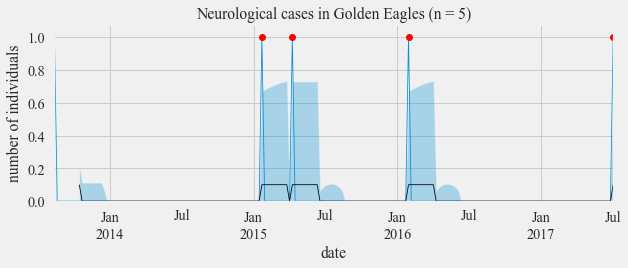

In [64]:
fig, ax1 = plt.subplots(1,1, figsize = (9,4))
plot_example(df= Golden_ana, ax=ax1, title="Neurological cases in Golden Eagles (n = 5)")
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Golden.svg' , dpi = 600)

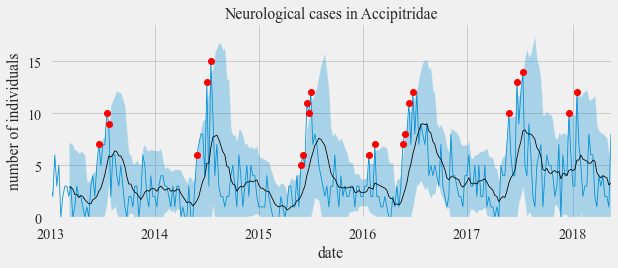

In [65]:
fig, ax1 = plt.subplots(1,1, figsize = (9,4))
plot_example(df= Accipitridae_ana, ax=ax1, title="Neurological cases in Accipitridae")
plt.tight_layout()
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Accipitridae.svg' , dpi = 600)

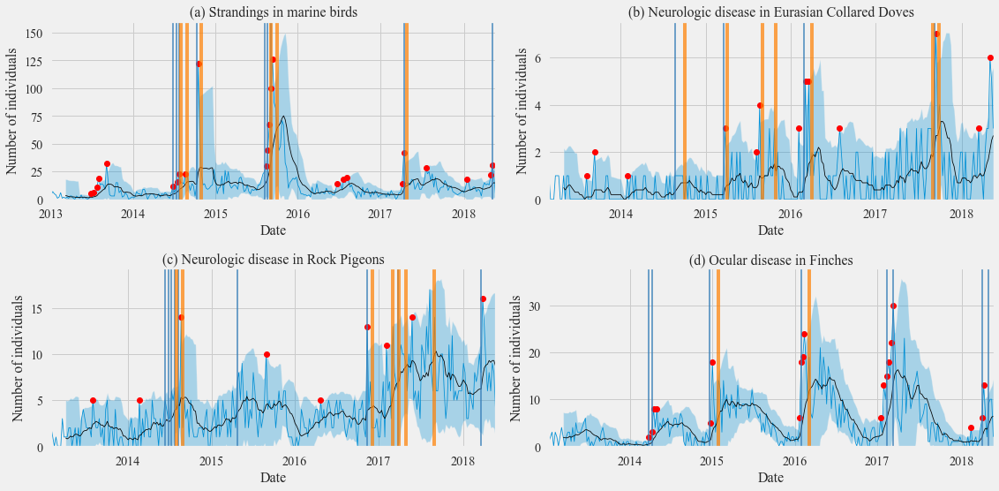

In [66]:
fig, ((ax1, ax2),(ax3, ax4))  = plt.subplots(2, 2, sharex= False, figsize=(16, 8)) 
ana_week_marine['# admissions'].plot(ax= ax1,label='# admissions')
ana_week_marine['rolling mean'].plot(ax= ax1,label='rolling mean', color = 'black')
ana_week_marine['anomalies'].plot(style='ro', ax= ax1,label='anomalies')


ax1.fill_between(ana_week_marine.index,ana_week_marine['rolling mean']+2*(ana_week_marine['rolling std']), 
                ana_week_marine['rolling mean']-2*(ana_week_marine['rolling std']), alpha = 0.3)
ax1.set_ylim(0)
#plt.legend(loc='upper left')
ax1.set_ylabel('number of individuals')
ax1.set_xlabel('date')
for bw in a_marine[a_marine.anomaliesBIW.notna()].index.values:
    ax1.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_marine[a_marine.anomaliesM.notna()].index.values:
    ax1.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax1.set_xlabel('Date', fontsize = f)
ax1.set_ylabel('Number of individuals', fontsize = f)
ax1.set_title('(a) Strandings in marine birds', fontsize = f)



ana_week_eurasian_dove['# admissions'].plot(ax= ax2,label='# admissions')
ana_week_eurasian_dove['rolling mean'].plot(ax= ax2,label='rolling mean', color = 'black')
ana_week_eurasian_dove['anomalies'].plot(style='ro', ax= ax2,label='anomalies')


ax2.fill_between(ana_week_eurasian_dove.index,ana_week_eurasian_dove['rolling mean']+2*(ana_week_eurasian_dove['rolling std']), 
                ana_week_eurasian_dove['rolling mean']-2*(ana_week_eurasian_dove['rolling std']), alpha = 0.3)
ax2.set_ylim(0)
#plt.legend(loc='upper left')
ax2.set_ylabel('number of individuals')
ax2.set_xlabel('date')
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesBIW.notna()].index.values:
    ax2.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesM.notna()].index.values:
    ax2.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax2.set_xlabel('Date', fontsize = f)
ax2.set_ylabel('Number of individuals', fontsize = f)
ax2.set_title('(b) Neurologic disease in Eurasian Collared Doves', fontsize = f)



ana_week_rock['# admissions'].plot(ax= ax3,label='# admissions')
ana_week_rock['rolling mean'].plot(ax= ax3,label='rolling mean', color = 'black')
ana_week_rock['anomalies'].plot(style='ro', ax= ax3,label='anomalies')


ax3.fill_between(ana_week_rock.index,ana_week_rock['rolling mean']+2*(ana_week_rock['rolling std']), 
                ana_week_rock['rolling mean']-2*(ana_week_rock['rolling std']), alpha = 0.3)
ax3.set_ylim(0)
#plt.legend(loc='upper left')
ax3.set_ylabel('number of individuals')
ax3.set_xlabel('date')
for bw in a_rock[a_rock.anomaliesBIW.notna()].index.values:
    ax3.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_rock[a_rock.anomaliesM.notna()].index.values:
    ax3.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax3.set_xlabel('Date', fontsize = f)
ax3.set_ylabel('Number of individuals', fontsize = f)
ax3.set_title('(c) Neurologic disease in Rock Pigeons', fontsize = f)


ana_week_finches['# admissions'].plot(ax= ax4,label='# admissions')
ana_week_finches['rolling mean'].plot(ax= ax4,label='rolling mean', color = 'black')
ana_week_finches['anomalies'].plot(style='ro', ax= ax4,label='anomalies')


ax4.fill_between(ana_week_finches.index,ana_week_finches['rolling mean']+2*(ana_week_finches['rolling std']), 
                ana_week_finches['rolling mean']-2*(ana_week_finches['rolling std']), alpha = 0.3)
ax4.set_ylim(0)
#plt.legend(loc='upper left')
ax4.set_ylabel('number of individuals')
ax4.set_xlabel('date')
for bw in a_finches[a_finches.anomaliesBIW.notna()].index.values:
    ax4.axvline(bw, color='#377eb8', linewidth = 2, alpha = 0.7)
for bw in a_finches[a_finches.anomaliesM.notna()].index.values:
    ax4.axvline(bw, color='#ff7f00', linewidth = 4, alpha = 0.7)

ax4.set_xlabel('Date', fontsize = f)
ax4.set_ylabel('Number of individuals', fontsize = f)
ax4.set_title('(d) Ocular disease in Finches', fontsize = f)
plt.tight_layout()


plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1.svg' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1.pdf' , dpi = 600)

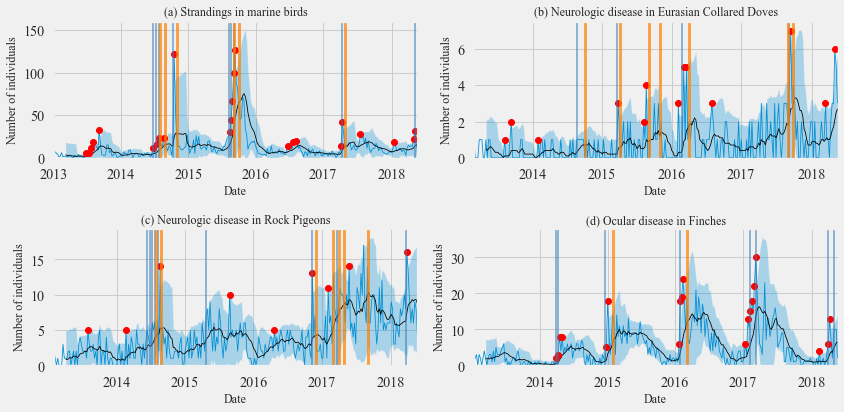

In [67]:
fig, ((ax1, ax2),(ax3, ax4))  = plt.subplots(2, 2, sharex= False, figsize=(16*0.75, 8*0.75)) 
ana_week_marine['# admissions'].plot(ax= ax1,label='# admissions')
ana_week_marine['rolling mean'].plot(ax= ax1,label='rolling mean', color = 'black')
ana_week_marine['anomalies'].plot(style='ro', ax= ax1,label='anomalies')


ax1.fill_between(ana_week_marine.index,ana_week_marine['rolling mean']+2*(ana_week_marine['rolling std']), 
                ana_week_marine['rolling mean']-2*(ana_week_marine['rolling std']), alpha = 0.3)
ax1.set_ylim(0)
#plt.legend(loc='upper left')
ax1.set_ylabel('number of individuals')
ax1.set_xlabel('date')
for bw in a_marine[a_marine.anomaliesBIW.notna()].index.values:
    ax1.axvline(bw, color='#377eb8', linewidth = 2*0.75, alpha = 0.7)
for bw in a_marine[a_marine.anomaliesM.notna()].index.values:
    ax1.axvline(bw, color='#ff7f00', linewidth = 4*0.75, alpha = 0.7)

ax1.set_xlabel('Date', fontsize = f*0.75)
ax1.set_ylabel('Number of individuals', fontsize = f*0.75)
ax1.set_title('(a) Strandings in marine birds', fontsize = f*0.75)



ana_week_eurasian_dove['# admissions'].plot(ax= ax2,label='# admissions')
ana_week_eurasian_dove['rolling mean'].plot(ax= ax2,label='rolling mean', color = 'black')
ana_week_eurasian_dove['anomalies'].plot(style='ro', ax= ax2,label='anomalies')


ax2.fill_between(ana_week_eurasian_dove.index,ana_week_eurasian_dove['rolling mean']+2*(ana_week_eurasian_dove['rolling std']), 
                ana_week_eurasian_dove['rolling mean']-2*(ana_week_eurasian_dove['rolling std']), alpha = 0.3)
ax2.set_ylim(0)
#plt.legend(loc='upper left')
ax2.set_ylabel('number of individuals')
ax2.set_xlabel('date')
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesBIW.notna()].index.values:
    ax2.axvline(bw, color='#377eb8', linewidth = 2*0.75, alpha = 0.7)
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesM.notna()].index.values:
    ax2.axvline(bw, color='#ff7f00', linewidth = 4*0.75, alpha = 0.7)

ax2.set_xlabel('Date', fontsize = f*0.75)
ax2.set_ylabel('Number of individuals', fontsize = f*0.75)
ax2.set_title('(b) Neurologic disease in Eurasian Collared Doves', fontsize = f*0.75)



ana_week_rock['# admissions'].plot(ax= ax3,label='# admissions')
ana_week_rock['rolling mean'].plot(ax= ax3,label='rolling mean', color = 'black')
ana_week_rock['anomalies'].plot(style='ro', ax= ax3,label='anomalies')


ax3.fill_between(ana_week_rock.index,ana_week_rock['rolling mean']+2*(ana_week_rock['rolling std']), 
                ana_week_rock['rolling mean']-2*(ana_week_rock['rolling std']), alpha = 0.3)
ax3.set_ylim(0)
#plt.legend(loc='upper left')
ax3.set_ylabel('number of individuals')
ax3.set_xlabel('date')
for bw in a_rock[a_rock.anomaliesBIW.notna()].index.values:
    ax3.axvline(bw, color='#377eb8', linewidth = 2*0.75, alpha = 0.7)
for bw in a_rock[a_rock.anomaliesM.notna()].index.values:
    ax3.axvline(bw, color='#ff7f00', linewidth = 4*0.75, alpha = 0.7)

ax3.set_xlabel('Date', fontsize = f*0.75)
ax3.set_ylabel('Number of individuals', fontsize = f*0.75)
ax3.set_title('(c) Neurologic disease in Rock Pigeons', fontsize = f*0.75)


ana_week_finches['# admissions'].plot(ax= ax4,label='# admissions')
ana_week_finches['rolling mean'].plot(ax= ax4,label='rolling mean', color = 'black')
ana_week_finches['anomalies'].plot(style='ro', ax= ax4,label='anomalies')


ax4.fill_between(ana_week_finches.index,ana_week_finches['rolling mean']+2*(ana_week_finches['rolling std']), 
                ana_week_finches['rolling mean']-2*(ana_week_finches['rolling std']), alpha = 0.3)
ax4.set_ylim(0)
#plt.legend(loc='upper left')
ax4.set_ylabel('number of individuals')
ax4.set_xlabel('date')
for bw in a_finches[a_finches.anomaliesBIW.notna()].index.values:
    ax4.axvline(bw, color='#377eb8', linewidth = 2*0.75, alpha = 0.7)
for bw in a_finches[a_finches.anomaliesM.notna()].index.values:
    ax4.axvline(bw, color='#ff7f00', linewidth = 4*0.75, alpha = 0.7)

ax4.set_xlabel('Date', fontsize = f*0.75)
ax4.set_ylabel('Number of individuals', fontsize = f*0.75)
ax4.set_title('(d) Ocular disease in Finches', fontsize = f*0.75)
plt.tight_layout()


plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1_v2.svg' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1_v2.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1_v2.pdf' , dpi = 600)

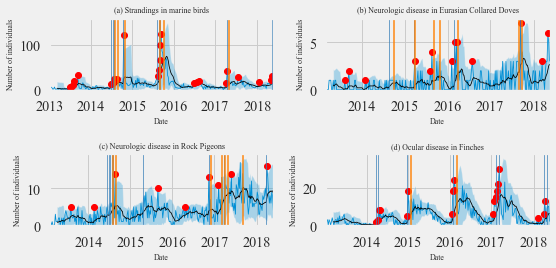

In [68]:
fig, ((ax1, ax2),(ax3, ax4))  = plt.subplots(2, 2, sharex= False, figsize=(16*0.5, 8*0.5)) 
ana_week_marine['# admissions'].plot(ax= ax1,label='# admissions')
ana_week_marine['rolling mean'].plot(ax= ax1,label='rolling mean', color = 'black')
ana_week_marine['anomalies'].plot(style='ro', ax= ax1,label='anomalies')


ax1.fill_between(ana_week_marine.index,ana_week_marine['rolling mean']+2*(ana_week_marine['rolling std']), 
                ana_week_marine['rolling mean']-2*(ana_week_marine['rolling std']), alpha = 0.3)
ax1.set_ylim(0)
#plt.legend(loc='upper left')
ax1.set_ylabel('number of individuals')
ax1.set_xlabel('date')
for bw in a_marine[a_marine.anomaliesBIW.notna()].index.values:
    ax1.axvline(bw, color='#377eb8', linewidth = 2*0.5, alpha = 0.7)
for bw in a_marine[a_marine.anomaliesM.notna()].index.values:
    ax1.axvline(bw, color='#ff7f00', linewidth = 4*0.5, alpha = 0.7)

ax1.set_xlabel('Date', fontsize = f*0.5)
ax1.set_ylabel('Number of individuals', fontsize = f*0.5)
ax1.set_title('(a) Strandings in marine birds', fontsize = f*0.5)



ana_week_eurasian_dove['# admissions'].plot(ax= ax2,label='# admissions')
ana_week_eurasian_dove['rolling mean'].plot(ax= ax2,label='rolling mean', color = 'black')
ana_week_eurasian_dove['anomalies'].plot(style='ro', ax= ax2,label='anomalies')


ax2.fill_between(ana_week_eurasian_dove.index,ana_week_eurasian_dove['rolling mean']+2*(ana_week_eurasian_dove['rolling std']), 
                ana_week_eurasian_dove['rolling mean']-2*(ana_week_eurasian_dove['rolling std']), alpha = 0.3)
ax2.set_ylim(0)
#plt.legend(loc='upper left')
ax2.set_ylabel('number of individuals')
ax2.set_xlabel('date')
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesBIW.notna()].index.values:
    ax2.axvline(bw, color='#377eb8', linewidth = 2*0.5, alpha = 0.7)
for bw in a_eurasian_dove[a_eurasian_dove.anomaliesM.notna()].index.values:
    ax2.axvline(bw, color='#ff7f00', linewidth = 4*0.5, alpha = 0.7)

ax2.set_xlabel('Date', fontsize = f*0.5)
ax2.set_ylabel('Number of individuals', fontsize = f*0.5)
ax2.set_title('(b) Neurologic disease in Eurasian Collared Doves', fontsize = f*0.5)



ana_week_rock['# admissions'].plot(ax= ax3,label='# admissions')
ana_week_rock['rolling mean'].plot(ax= ax3,label='rolling mean', color = 'black')
ana_week_rock['anomalies'].plot(style='ro', ax= ax3,label='anomalies')


ax3.fill_between(ana_week_rock.index,ana_week_rock['rolling mean']+2*(ana_week_rock['rolling std']), 
                ana_week_rock['rolling mean']-2*(ana_week_rock['rolling std']), alpha = 0.3)
ax3.set_ylim(0)
#plt.legend(loc='upper left')
ax3.set_ylabel('number of individuals')
ax3.set_xlabel('date')
for bw in a_rock[a_rock.anomaliesBIW.notna()].index.values:
    ax3.axvline(bw, color='#377eb8', linewidth = 2*0.5, alpha = 0.7)
for bw in a_rock[a_rock.anomaliesM.notna()].index.values:
    ax3.axvline(bw, color='#ff7f00', linewidth = 4*0.5, alpha = 0.7)

ax3.set_xlabel('Date', fontsize = f*0.5)
ax3.set_ylabel('Number of individuals', fontsize = f*0.5)
ax3.set_title('(c) Neurologic disease in Rock Pigeons', fontsize = f*0.5)


ana_week_finches['# admissions'].plot(ax= ax4,label='# admissions')
ana_week_finches['rolling mean'].plot(ax= ax4,label='rolling mean', color = 'black')
ana_week_finches['anomalies'].plot(style='ro', ax= ax4,label='anomalies')


ax4.fill_between(ana_week_finches.index,ana_week_finches['rolling mean']+2*(ana_week_finches['rolling std']), 
                ana_week_finches['rolling mean']-2*(ana_week_finches['rolling std']), alpha = 0.3)
ax4.set_ylim(0)
#plt.legend(loc='upper left')
ax4.set_ylabel('number of individuals')
ax4.set_xlabel('date')
for bw in a_finches[a_finches.anomaliesBIW.notna()].index.values:
    ax4.axvline(bw, color='#377eb8', linewidth = 2*0.5, alpha = 0.7)
for bw in a_finches[a_finches.anomaliesM.notna()].index.values:
    ax4.axvline(bw, color='#ff7f00', linewidth = 4*0.5, alpha = 0.7)

ax4.set_xlabel('Date', fontsize = f*0.5)
ax4.set_ylabel('Number of individuals', fontsize = f*0.5)
ax4.set_title('(d) Ocular disease in Finches', fontsize = f*0.5)
plt.tight_layout()


plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1_v3.svg' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1_v3.png' , dpi = 600)
plt.savefig('C:/Users/falco/Desktop/directory/WRMD_paper/outputs/final_figures/Figure3_r1_v3.pdf' , dpi = 600)